In [1]:
import pandas as pd
from glob import glob
import os

print('current PATH : ', os.getcwd())
# 이거 정리해둬야함.
import matplotlib as mat
import matplotlib.font_manager as fm
import matplotlib as mpl
from matplotlib import font_manager, rc

import sys
sys.path

font_path = '/opt/anaconda3/envs/cluster_venv/lib/python3.7/site-packages/matplotlib/mpl-data/fonts/ttf/Times New Roman Font.ttf'
font = font_manager.FontProperties(fname=font_path).get_name()
rc('font', family=font)

current PATH :  /Users/jeonjunhwi/문서/Projects/GNN_Covid


# Figure 1

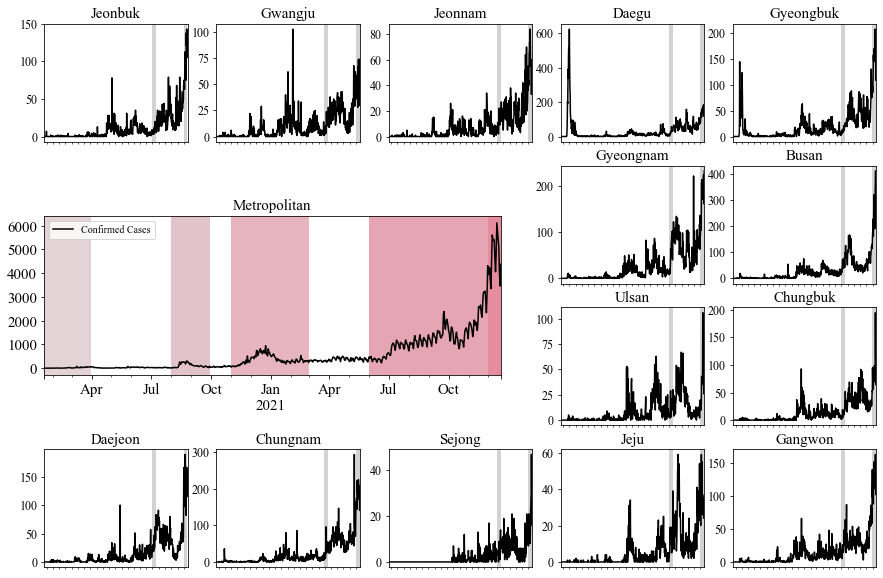

In [2]:
from datetime import datetime
import matplotlib.pyplot as plt

## Load Data ##
region_type = 'city'
smooth = pd.read_csv(f'Data/KCDC_data/Processing_Results/smoothing_5_{region_type}_mean.csv', index_col=0, encoding='cp949')
df = pd.read_csv(f'Data/KCDC_data/Processing_Results/smoothing_1_{region_type}_mean.csv', index_col=0, encoding='cp949')
df.index = pd.to_datetime(df.index)
smooth.index = pd.to_datetime(smooth.index)

# df = df.diff().dropna()
# smooth의 비어있는 날짜(앞의 4일)을 채워줌
tmp = pd.DataFrame(1, index=df.index, columns=df.columns)
smooth = (tmp * smooth).fillna(0)
end_idx = 702 # 682
## Plotting Data ##
# fig, ax = plt.subplots(nrows=4,ncols=6, figsize=(15,10))
plt.figure(figsize=(18, 10))

reg_idx = [66, 80, 85, 107, 115, 138, 156, 172, 177, 188, 193, 208, 209, 211, 229]
reg_name = ['Jeonbuk', 'Gwangju', 'Jeonnam', 'Daegu', 'Gyeongbuk', 'Gyeongnam', 'Busan', 'Ulsan', 'Chungbuk', 'Daejeon', 'Chungnam', 'Sejong', 'Jeju', 'Gangwon']
fig_idx = [1, 2, 3, 4, 5, 10, 11, 16, 17, 19, 20, 21, 22, 23]
for idx, i in enumerate(fig_idx):
    ax0=plt.subplot(4, 6, i)
    df.iloc[:end_idx,reg_idx[idx]:reg_idx[idx+1]].sum(axis=1).plot(ax=ax0, label=reg_name[idx], color='k')
    # smooth.iloc[:end_idx,reg_idx[idx]:reg_idx[idx+1]].sum(axis=1).plot(ax=ax0, label='5-day smooth', color = 'orange')#, style='--')
    ax0.set_xlabel('')
    ax0.set_title(reg_name[idx], fontsize=15)
    ax0.set_xticks([])
    plt.yticks(fontsize=12)
    
    span_start = datetime(2021, 11, 30)
    span_end = datetime(2021, 12, 19)
    ax0.axvspan(span_start, span_end, facecolor='lightgray')
    span_start = datetime(2021, 6, 30)
    span_end = datetime(2021, 7, 19)
    ax0.axvspan(span_start, span_end, facecolor='lightgray')
    # 1차
    # span_start = datetime(2020, 1, 19)
    # span_end = datetime(2020, 3, 31)
    # ax0.axvspan(span_start, span_end, facecolor='#e3d3d7')
    # # 2차
    # span_start = datetime(2020, 8, 1)
    # span_end = datetime(2020, 9, 30)
    # ax0.axvspan(span_start, span_end, facecolor='#e3c3ca')
    # # 3차
    # span_start = datetime(2020, 11, 1)
    # span_end = datetime(2021, 2, 28)
    # ax0.axvspan(span_start, span_end, facecolor='#e6b5bf')
    # # 4차
    # span_start = datetime(2021, 6, 1)
    # span_end = datetime(2021, 11, 30)
    # ax0.axvspan(span_start, span_end, facecolor='#e6a5b2')
    # # 5차
    # span_start = datetime(2021, 12, 1)
    # span_end = datetime(2021, 12, 30)
    # ax0.axvspan(span_start, span_end, facecolor='#e68c9e')

# 수도권
ax1 = plt.subplot(3, 2, 3)
df.iloc[:end_idx,:66].sum(axis=1).plot(ax=ax1, label="Metropolitan", color = 'k')
# smooth.iloc[:end_idx,:66].sum(axis=1).plot(ax=ax1, label='5-day smooth', color = 'orange')#, linewidth=0.7)
ax1.set_title("Metropolitan", fontsize=15)
ax1.set_xlabel('')
ax1.legend(['Confirmed Cases', '5-day smoothing'], fontsize=10)
plt.yticks(fontsize=15)
plt.xticks(fontsize=15)


# 1차
span_start = datetime(2020, 1, 19)
span_end = datetime(2020, 3, 31)
ax1.axvspan(span_start, span_end, facecolor='#e3d3d7')
# 2차
span_start = datetime(2020, 8, 1)
span_end = datetime(2020, 9, 30)
ax1.axvspan(span_start, span_end, facecolor='#e3c3ca')
# 3차
span_start = datetime(2020, 11, 1)
span_end = datetime(2021, 2, 28)
ax1.axvspan(span_start, span_end, facecolor='#e6b5bf')
# 4차
span_start = datetime(2021, 6, 1)
span_end = datetime(2021, 11, 30)
ax1.axvspan(span_start, span_end, facecolor='#e6a5b2')
# 5차
span_start = datetime(2021, 12, 1)
span_end = datetime(2021, 12, 30)
ax1.axvspan(span_start, span_end, facecolor='#e68c9e')

# span_start = datetime(2021, 11, 30)
# span_end = datetime(2021, 12, 19)
# ax1.axvspan(span_start, span_end, facecolor='lightgray')
# span_start = datetime(2021, 6, 30)
# span_end = datetime(2021, 7, 19)
# ax1.axvspan(span_start, span_end, facecolor='lightgray')

# plt.suptitle('Confirmed cases by State', fontsize=25)
# plt.text(2, 2, 'Confirmed cases by State', va='center', ha='center', fontsize=25)
# plt.tight_layout()
# plt.show()
plt.savefig('pdf_image/fig_1_revise.pdf', bbox_inches='tight')

IndexError: list index out of range

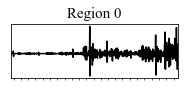

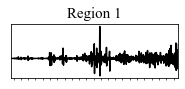

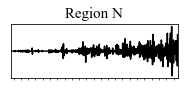

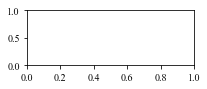

In [21]:
from datetime import datetime
import matplotlib.pyplot as plt

## Load Data ##
region_type = 'city'
smooth = pd.read_csv(f'Data/KCDC_data/Processing_Results/smoothing_5_{region_type}_mean.csv', index_col=0, encoding='cp949')
df = pd.read_csv(f'Data/KCDC_data/Processing_Results/smoothing_1_{region_type}_mean.csv', index_col=0, encoding='cp949')
df.index = pd.to_datetime(df.index)
smooth.index = pd.to_datetime(smooth.index)

end_idx = 702 # 682
# plt.figure(figsize=(18, 10))

reg_idx = [66, 80, 85, 107, 115, 138, 156, 172, 177, 188, 193, 208, 209, 211, 229]
reg_name = ['Region 0', 'Region 1', 'Region N']
fig_idx = [1, 2, 3, 4, 5, 10, 11, 16, 17, 19, 20, 21, 22, 23]
# for idx, i in enumerate(fig_idx):
#     fig, ax0=plt.subplots(figsize=(3, 1))
#     df.iloc[:end_idx,reg_idx[idx]:reg_idx[idx+1]].sum(axis=1).plot(ax = ax0, label=reg_name[idx], color='k')
#     ax0.set_xlabel('')
#     ax0.set_title(reg_name[idx], fontsize=15)
#     ax0.set_xticks([])
#     ax0.set_yticks([])
    
for idx, i in enumerate(fig_idx):
    fig, ax0=plt.subplots(figsize=(3, 1))
    df.iloc[:end_idx,reg_idx[idx]:reg_idx[idx+1]].diff().sum(axis=1).plot(ax = ax0, label=reg_name[idx], color='k')
    ax0.set_xlabel('')
    ax0.set_title(reg_name[idx], fontsize=15)
    ax0.set_xticks([])
    ax0.set_yticks([])

Fig 1 원본

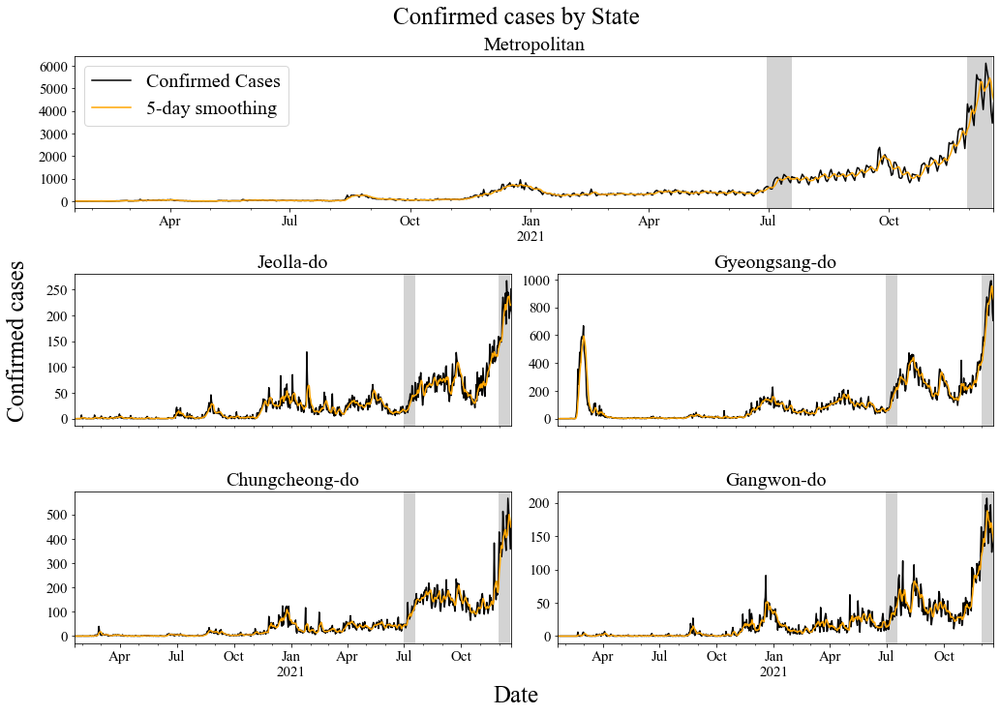

In [78]:
from datetime import datetime
import matplotlib.pyplot as plt

## Load Data ##
region_type = 'city'
smooth = pd.read_csv(f'Data/KCDC_data/Processing_Results/smoothing_5_{region_type}_mean.csv', index_col=0, encoding='cp949')
df = pd.read_csv(f'Data/KCDC_data/Processing_Results/smoothing_1_{region_type}_mean.csv', index_col=0, encoding='cp949')
df.index = pd.to_datetime(df.index)
smooth.index = pd.to_datetime(smooth.index)

# df = df.diff().dropna()
# smooth의 비어있는 날짜(앞의 4일)을 채워줌
tmp = pd.DataFrame(1, index=df.index, columns=df.columns)
smooth = (tmp * smooth).fillna(0)
end_idx = 702 # 682
## Plotting Data ##
fig, ax = plt.subplots(nrows=3,ncols=2, figsize=(14,10))

ax0=plt.subplot(3, 1, 1)
df.iloc[:end_idx,:66].sum(axis=1).plot(ax=ax0, label='Metropolitan', color='k')
smooth.iloc[:end_idx,:66].sum(axis=1).plot(ax=ax0, label='5-day smooth', color = 'orange')#, style='--')
ax0.set_xlabel('')
ax0.set_title('Metropolitan', fontsize=20)
ax0.legend(['Confirmed Cases', '5-day smoothing'], fontsize=20)
plt.yticks(fontsize=15)
plt.xticks(fontsize=15)

ax1 = plt.subplot(3, 2, 3)
df.iloc[:end_idx,66:107].sum(axis=1).plot(ax=ax1, label="Jeolla-do", color = 'k')
smooth.iloc[:end_idx,66:107].sum(axis=1).plot(ax=ax1, label='5-day smooth', color = 'orange')#, linewidth=0.7)
ax1.set_title('Jeolla-do', fontsize=20)
ax1.set_xlabel('')
ax1.set_xticks([])
plt.yticks(fontsize=15)

ax2 = plt.subplot(3, 2, 4)
df.iloc[:end_idx,107:177].sum(axis=1).plot(ax=ax2, label='Gyeongsang-do', color='k')
smooth.iloc[:end_idx,107:177].sum(axis=1).plot(ax=ax2, label='5-day smooth', color = 'orange')
ax2.set_title('Gyeongsang-do', fontsize=20)
ax2.set_xlabel('')
ax2.set_xticks([])
plt.yticks(fontsize=15)

ax3 = plt.subplot(3, 2, 5)
df.iloc[:end_idx,177:209].sum(axis=1).plot(ax=ax3, label='Chungcheong-do', color='k')
smooth.iloc[:end_idx,177:209].sum(axis=1).plot(ax=ax3, label='5-day smooth', color = 'orange')
ax3.set_title('Chungcheong-do', fontsize=20)
ax3.set_xlabel('')
plt.yticks(fontsize=15)
plt.xticks(fontsize=15)

ax4 = plt.subplot(3, 2, 6)
df.iloc[:end_idx,209:].sum(axis=1).plot(ax=ax4, label='Gangwon-do, Jeju-do', color='k')
smooth.iloc[:end_idx,209:].sum(axis=1).plot(ax=ax4, label='5-day smooth', color = 'orange')
ax4.set_xlabel('')
ax4.set_title('Gangwon-do', fontsize=20)
plt.yticks(fontsize=15)
plt.xticks(fontsize=15)
fig.text(0.5, -0.01, 'Date', va='center', ha='center', fontsize=25)
fig.text(-0.01, 0.5, 'Confirmed cases', va='center', ha='center', rotation='vertical', fontsize = 25)


# span_start = datetime(2021, 9, 18)
# span_end = datetime(2021, 11, 24)
span_start = datetime(2021, 11, 30)
span_end = datetime(2021, 12, 19)
ax0.axvspan(span_start, span_end, facecolor='lightgray')
ax1.axvspan(span_start, span_end, facecolor='lightgray')
ax2.axvspan(span_start, span_end, facecolor='lightgray')
ax3.axvspan(span_start, span_end, facecolor='lightgray')
ax4.axvspan(span_start, span_end, facecolor='lightgray')


span_start = datetime(2021, 6, 30)
span_end = datetime(2021, 7, 19)
ax0.axvspan(span_start, span_end, facecolor='lightgray')
ax1.axvspan(span_start, span_end, facecolor='lightgray')
ax2.axvspan(span_start, span_end, facecolor='lightgray')
ax3.axvspan(span_start, span_end, facecolor='lightgray')
ax4.axvspan(span_start, span_end, facecolor='lightgray')

plt.suptitle('Confirmed cases by State', fontsize=25)
plt.tight_layout()
# plt.show()
plt.savefig('pdf_image/fig_1.pdf')

# 기간별 plot

2020-08-05
2020-10-24
2021-02-21
2021-10-29
2022-08-15


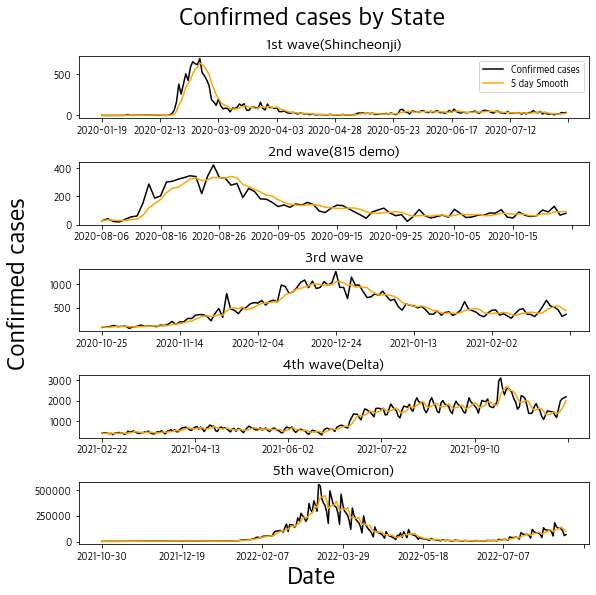

In [165]:
## Load Data ##
region_type = 'city'
smooth = pd.read_csv(f'Data/KCDC_data/Processing_Results/smoothing_5_{region_type}_mean.csv', index_col=0, encoding='cp949')
df = pd.read_csv(f'Data/KCDC_data/Processing_Results/smoothing_1_{region_type}_mean.csv', index_col=0, encoding='cp949')

# smooth의 비어있는 날짜(앞의 4일)을 채워줌
tmp = pd.DataFrame(1, index=df.index, columns=df.columns)
smooth = (tmp * smooth).fillna(0)

## Plotting Data ##
import matplotlib.pyplot as plt
fig, ax = plt.subplots(nrows=5,ncols=1, figsize=(8,8))

df.iloc[:200,:].sum(axis=1).plot(ax=ax[0], label='Confirmed cases', color='k')
smooth.iloc[:200,:].sum(axis=1).plot(ax=ax[0], label='5 day Smooth', color = 'orange')#, style='--')
print(df.iloc[:200].index[-1])
ax[0].set_xlabel('')
ax[0].set_title('1st wave(Shincheonji)', fontsize=15)
# ax[0].set_xticks([])
ax[0].legend()

df.iloc[200:280,:].sum(axis=1).plot(ax=ax[1], color = 'k')
smooth.iloc[200:280,:].sum(axis=1).plot(ax=ax[1], color = 'orange')#, linewidth=0.7)
print(df.iloc[:280].index[-1])
ax[1].set_title('2nd wave(815 demo)', fontsize=15)
ax[1].set_xlabel('')
# ax[1].set_xticks([])
# ax[1].legend()

df.iloc[280:400,:].sum(axis=1).plot(ax=ax[2], color='k')
smooth.iloc[280:400,:].sum(axis=1).plot(ax=ax[2], color = 'orange')
print(df.iloc[:400].index[-1])
ax[2].set_title('3rd wave', fontsize=15)
ax[2].set_xlabel('')
# ax[2].set_xticks([])
# ax[2].legend()

df.iloc[400:650,:].sum(axis=1).plot(ax=ax[3], color='k')
smooth.iloc[400:650,:].sum(axis=1).plot(ax=ax[3], color = 'orange')
print(df.iloc[:650].index[-1])
ax[3].set_title('4th wave(Delta)', fontsize=15)
ax[3].set_xlabel('')
# ax[3].set_xticks([])
# ax[3].legend()

df.iloc[650:,:].sum(axis=1).plot(ax=ax[4], color='k')
smooth.iloc[650:,:].sum(axis=1).plot(ax=ax[4], color = 'orange')
print(df.index[-1])
# ax[4].legend()
ax[4].set_xlabel('')
ax[4].set_title('5th wave(Omicron)', fontsize=15)

fig.text(0.5, -0.01, 'Date', va='center', ha='center', fontsize=25)
fig.text(-0.01, 0.5, 'Confirmed cases', va='center', ha='center', rotation='vertical', fontsize = 25)

# plt.xticks(rotation=45)
plt.suptitle('Confirmed cases by State', fontsize=25)
plt.tight_layout()
plt.show()

Metric

In [78]:
folder = 'df340'
MAE_df = pd.read_csv(f'Result/{folder}/region_MAE.csv', encoding='cp949', index_col=0)
RMSE_df = pd.read_csv(f'Result/{folder}/region_RMSE.csv', encoding='cp949', index_col=0)

In [79]:
metric_state = dict({
    'METRO' : MAE_df.iloc[:66].mean(),
    'JB' : MAE_df.iloc[66:80].mean(),
    'GJ' : MAE_df.iloc[80:85].mean(),
    'JN' : MAE_df.iloc[85:107].mean(),
    'DG' : MAE_df.iloc[107:115].mean(),
    'GB' : MAE_df.iloc[115:138].mean(),
    'GN' : MAE_df.iloc[138:156].mean(),
    'BS' : MAE_df.iloc[156:172].mean(),
    'US' : MAE_df.iloc[172:177].mean(),
    'CB' : MAE_df.iloc[177:188].mean(),
    'DJ' : MAE_df.iloc[188:193].mean(),
    'CN' : MAE_df.iloc[193:209].mean(),
    'JJ' : MAE_df.iloc[209:211].mean(),
    'GW' : MAE_df.iloc[211:].mean()
    })
pd.DataFrame(metric_state, index=MAE_df.columns, columns=metric_state.keys()).to_csv(f'Result/{folder}/state_MAE.csv',encoding='cp949')

In [80]:
metric_state = dict({
    'METRO' : RMSE_df.iloc[:66].mean(),
    'JB' : RMSE_df.iloc[66:80].mean(),
    'GJ' : RMSE_df.iloc[80:85].mean(),
    'JN' : RMSE_df.iloc[85:107].mean(),
    'DG' : RMSE_df.iloc[107:115].mean(),
    'GB' : RMSE_df.iloc[115:138].mean(),
    'GN' : RMSE_df.iloc[138:156].mean(),
    'BS' : RMSE_df.iloc[156:172].mean(),
    'US' : RMSE_df.iloc[172:177].mean(),
    'CB' : RMSE_df.iloc[177:188].mean(),
    'DJ' : RMSE_df.iloc[188:193].mean(),
    'CN' : RMSE_df.iloc[193:209].mean(),
    'JJ' : RMSE_df.iloc[209:211].mean(),
    'GW' : RMSE_df.iloc[211:].mean()
    })
pd.DataFrame(metric_state, index=RMSE_df.columns, columns=metric_state.keys()).to_csv(f'Result/{folder}/state_RMSE.csv',encoding='cp949')

Plot

In [81]:
from lib import save_figure_predict, matplotlib_plot_font
import pandas as pd
import warnings
warnings.filterwarnings('ignore')
matplotlib_plot_font()

/opt/anaconda3/envs/venvGNN/lib/python3.7/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
Using TensorFlow backend.


# Test data plot

In [10]:
region_type = 'city'
GROUND_TRUTH = pd.read_csv('Result/df340/ASTGCN_corr_0.7_1st/ground_truth.csv', index_col=0, encoding='cp949')
BASELINE = pd.read_csv('Result/Baseline_340/Pred/26/RNN/pred_LSTM_city.csv', index_col=0, encoding='cp949')
# y_pred = pd.read_csv('Result/df340/ASTGCN_corr_0.7_1st/corr_city_0.7_predict.csv',index_col=0, encoding='cp949')
# y_pred_2 = pd.read_csv('Result/df340/STGNN_dist_01_0.7_1st/dist_01_city_0.7_predict.csv',index_col=0, encoding='cp949')
# y_pred_3 = pd.read_csv('Result/df340/GCN_dist-corr_0.7_1st/dist-corr_city_0.7_predict.csv',index_col=0, encoding='cp949')

y_pred_1 = pd.read_csv('Result/cr_dist_340_64_false/cr_dist_340_64_false/Pred/26/DCRNN_cross_corr_0.3_1st/cross_corr_city_0.3_predict.csv', index_col=0, encoding='cp949')
y_pred_2 = pd.read_csv('Result/cr_dist_340_64_false/cr_dist_340_64_false/Pred/26/ASTGCN_cross_corr_0.3_1st/cross_corr_city_0.3_predict.csv', index_col=0, encoding='cp949')
y_pred_3 = pd.read_csv('Result/cr_dist_340_64_false/cr_dist_340_64_false/Pred/26/STGCN_cross_corr_0.3_1st/cross_corr_city_0.3_predict.csv', index_col=0, encoding='cp949')
y_pred_4 = pd.read_csv('Result/cr_dist_340_64_false/cr_dist_340_64_false/Pred/26/TGCN_cross_corr_0.3_1st/cross_corr_city_0.3_predict.csv', index_col=0, encoding='cp949')
y_pred_5 = pd.read_csv('Result/cr_dist_340_64_false/cr_dist_340_64_false/Pred/26/GCN_cross_corr_0.3_1st/cross_corr_city_0.3_predict.csv', index_col=0, encoding='cp949')

y_pred_6 = pd.read_csv('Result/cr_dist_340_64_false/cr_dist_340_64_false/Pred/26/DCRNN_cross_corr_0.5_1st/cross_corr_city_0.5_predict.csv', index_col=0, encoding='cp949')
y_pred_7 = pd.read_csv('Result/cr_dist_340_64_false/cr_dist_340_64_false/Pred/26/ASTGCN_cross_corr_0.5_1st/cross_corr_city_0.5_predict.csv', index_col=0, encoding='cp949')
y_pred_8 = pd.read_csv('Result/cr_dist_340_64_false/cr_dist_340_64_false/Pred/26/STGCN_cross_corr_0.5_1st/cross_corr_city_0.5_predict.csv', index_col=0, encoding='cp949')
y_pred_9 = pd.read_csv('Result/cr_dist_340_64_false/cr_dist_340_64_false/Pred/26/TGCN_cross_corr_0.5_1st/cross_corr_city_0.5_predict.csv', index_col=0, encoding='cp949')
y_pred_10 = pd.read_csv('Result/cr_dist_340_64_false/cr_dist_340_64_false/Pred/26/GCN_cross_corr_0.5_1st/cross_corr_city_0.5_predict.csv', index_col=0, encoding='cp949')

region_MAE = pd.read_csv('Result/cr_dist_340_64_false/cr_dist_340_64_false/Pred/26/region_MAE.csv', index_col=0, encoding='cp949')
region_RMSE = pd.read_csv('Result/cr_dist_340_64_false/cr_dist_340_64_false/Pred/26/region_MAE.csv', index_col=0, encoding='cp949')



y_pred_11 = pd.read_csv('Result/cr_dist_340_64_false/cr_dist_340_64_false/Pred/26/DCRNN_dist_01_0.3_1st/dist_01_city_0.3_predict.csv', index_col=0, encoding='cp949')
y_pred_12 = pd.read_csv('Result/cr_dist_340_64_false/cr_dist_340_64_false/Pred/26/ASTGCN_dist_01_0.3_1st/dist_01_city_0.3_predict.csv', index_col=0, encoding='cp949')
y_pred_13 = pd.read_csv('Result/cr_dist_340_64_false/cr_dist_340_64_false/Pred/26/STGCN_dist_01_0.3_1st/dist_01_city_0.3_predict.csv', index_col=0, encoding='cp949')
y_pred_14 = pd.read_csv('Result/cr_dist_340_64_false/cr_dist_340_64_false/Pred/26/TGCN_dist_01_0.3_1st/dist_01_city_0.3_predict.csv', index_col=0, encoding='cp949')
y_pred_15 = pd.read_csv('Result/cr_dist_340_64_false/cr_dist_340_64_false/Pred/26/GCN_dist_01_0.3_1st/dist_01_city_0.3_predict.csv', index_col=0, encoding='cp949')

y_pred_16 = pd.read_csv('Result/cr_dist_340_64_false/cr_dist_340_64_false/Pred/26/DCRNN_dist_01_0.8_1st/dist_01_city_0.8_predict.csv', index_col=0, encoding='cp949')
y_pred_17 = pd.read_csv('Result/cr_dist_340_64_false/cr_dist_340_64_false/Pred/26/ASTGCN_dist_01_0.8_1st/dist_01_city_0.8_predict.csv', index_col=0, encoding='cp949')
y_pred_18 = pd.read_csv('Result/cr_dist_340_64_false/cr_dist_340_64_false/Pred/26/STGCN_dist_01_0.8_1st/dist_01_city_0.8_predict.csv', index_col=0, encoding='cp949')
y_pred_19 = pd.read_csv('Result/cr_dist_340_64_false/cr_dist_340_64_false/Pred/26/TGCN_dist_01_0.8_1st/dist_01_city_0.8_predict.csv', index_col=0, encoding='cp949')
y_pred_20 = pd.read_csv('Result/cr_dist_340_64_false/cr_dist_340_64_false/Pred/26/GCN_dist_01_0.8_1st/dist_01_city_0.8_predict.csv', index_col=0, encoding='cp949')

# smooth_5 = pd.read_csv('Data/KCDC_data/Processing_Results/smoothing_5_city_mean.csv',index_col=0, encoding='cp949')
# smooth_5 = smooth_5[smooth_5.index<'2020-12-24'].diff().dropna().iloc[-26:]

In [188]:
region_MAE['DCRNN_cross_corr_0.3_MAE']
region_MAE['ASTGCN_cross_corr_0.3_MAE']
region_MAE['STGCN_cross_corr_0.3_MAE']
region_MAE['TGCN_cross_corr_0.3_MAE']
region_MAE['GCN_cross_corr_0.3_MAE']

인천 동구      1.126343
인천 부평구     5.395512
인천 미추홀구    2.544284
인천 서구      4.021566
인천 연수구     2.065858
             ...   
강원 화천군     0.270783
강원 정선군     0.641976
강원 인제군     0.222948
강원 양구군     0.180964
강원 횡성군     0.484904
Name: GCN_cross_corr_0.3_MAE, Length: 229, dtype: float64

In [22]:
from lib import compute_metrics
RMSE, RMSE_total = compute_metrics(GROUND_TRUTH, BASELINE, metric='rmse')
print('BASELINE', RMSE_total)
RMSE, RMSE_total = compute_metrics(GROUND_TRUTH, y_pred, metric='rmse')
print('y_pred', RMSE_total)
RMSE, RMSE_total = compute_metrics(GROUND_TRUTH, y_pred_2, metric='rmse')
print('y_pred_2', RMSE_total)
RMSE, RMSE_total = compute_metrics(GROUND_TRUTH, y_pred_3, metric='rmse')
print('y_pred_3', RMSE_total)
RMSE, RMSE_total = compute_metrics(GROUND_TRUTH, smooth_5, metric='rmse')
print('HA5', RMSE_total)

print(' ')
MAE, MAE_total = compute_metrics(GROUND_TRUTH, BASELINE, metric='mae')
print('BASELINE', MAE_total)
MAE, MAE_total = compute_metrics(GROUND_TRUTH, y_pred, metric='mae')
print('y_pred', MAE_total)
MAE, MAE_total = compute_metrics(GROUND_TRUTH, y_pred_2, metric='mae')
print('y_pred_2', MAE_total)
MAE, MAE_total = compute_metrics(GROUND_TRUTH, y_pred_3, metric='mae')
print('y_pred_3', MAE_total)
MAE, MAE_total = compute_metrics(GROUND_TRUTH, smooth_5, metric='mae')
print('HA5', MAE_total)

BASELINE 5.483127341200197
y_pred 5.01812969795208
y_pred_2 4.433788625671538
y_pred_3 4.659355980738824
HA5 4.95305404508475
 
BASELINE 2.2384984752872104
y_pred 1.9766407813703566
y_pred_2 1.9977233560102976
y_pred_3 1.927527200595362
HA5 2.060833053409472


In [25]:
select = ['서울 강남구', '대전 서구', '광주 서구', '부산 해운대구']
GROUND_TRUTH[select].columns
submit_01 = pd.concat([y_pred_1[select], y_pred_2[select], y_pred_3[select], y_pred_4[select], y_pred_5[select]], axis=1)
submit_02 = pd.concat([y_pred_6[select], y_pred_7[select], y_pred_8[select], y_pred_9[select], y_pred_10[select]], axis=1)
submit_03 = pd.concat([y_pred_11[select], y_pred_12[select], y_pred_13[select], y_pred_14[select], y_pred_15[select]], axis=1)
submit_04 = pd.concat([y_pred_16[select], y_pred_17[select], y_pred_18[select], y_pred_19[select], y_pred_20[select]], axis=1)



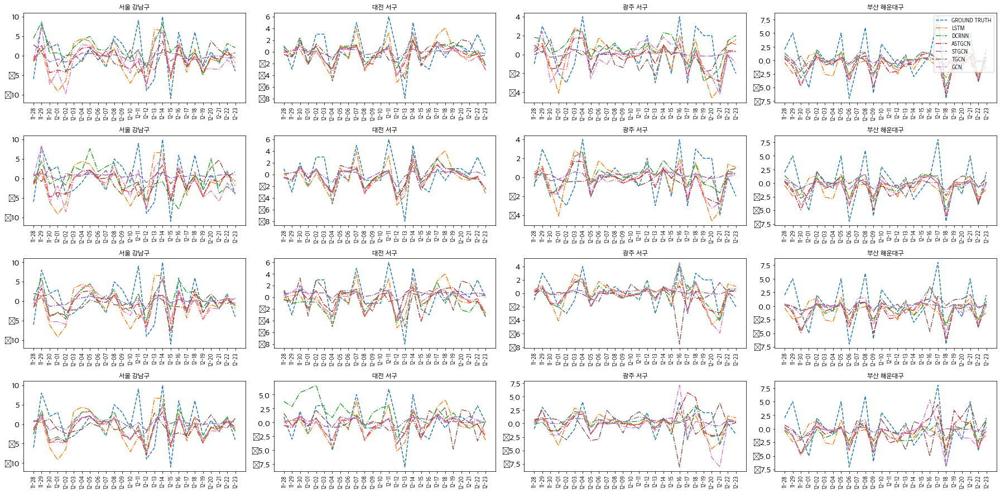

In [86]:
# select = ['서울 강남구', '대전 서구', '광주 서구', '부산 해운대구']
fig = plt.figure(figsize=(25,15), facecolor='white')
for i, select in enumerate(['서울 강남구', '대전 서구', '광주 서구', '부산 해운대구']):
    fig.add_subplot(5,4,i+1)
    plt.plot(GROUND_TRUTH[select], '--')
    plt.plot(BASELINE[select],'-.')
    plt.plot(y_pred_1[select],'-.')
    plt.plot(y_pred_2[select],'-.')
    plt.plot(y_pred_3[select],'-.')
    plt.plot(y_pred_4[select],'-.')
    plt.plot(y_pred_5[select],'-.')
    plt.title(select)
    xlabels = [i[5:] for i in list(GROUND_TRUTH.index)] # i[5:] yyyy-mm-dd -> mm-dd
    plt.xticks(ticks = [i for i in range(len(xlabels))], labels = xlabels, rotation=90)
    plt.yticks(fontsize = 15)
plt.legend(['GROUND TRUTH', 'LSTM', 'DCRNN', 'ASTGCN', 'STGCN', 'TGCN', 'GCN'])

for i, select in enumerate(['서울 강남구', '대전 서구', '광주 서구', '부산 해운대구']):
    fig.add_subplot(5,4,i+5)
    plt.plot(GROUND_TRUTH[select],'--')
    plt.plot(BASELINE[select],'-.')
    plt.plot(y_pred_6[select],'-.')
    plt.plot(y_pred_7[select],'-.')
    plt.plot(y_pred_8[select],'-.')
    plt.plot(y_pred_9[select],'-.')
    plt.plot(y_pred_10[select],'-.')
    plt.title(select)
    xlabels = [i[5:] for i in list(GROUND_TRUTH.index)] # i[5:] yyyy-mm-dd -> mm-dd
    plt.xticks(ticks = [i for i in range(len(xlabels))], labels = xlabels, rotation=90)
    plt.yticks(fontsize = 15)
    
for i, select in enumerate(['서울 강남구', '대전 서구', '광주 서구', '부산 해운대구']):
    fig.add_subplot(5,4,i+9)
    plt.plot(GROUND_TRUTH[select],'--')
    plt.plot(BASELINE[select],'-.')
    plt.plot(y_pred_11[select],'-.')
    plt.plot(y_pred_12[select],'-.')
    plt.plot(y_pred_13[select],'-.')
    plt.plot(y_pred_14[select],'-.')
    plt.plot(y_pred_15[select],'-.')
    plt.title(select)
    xlabels = [i[5:] for i in list(GROUND_TRUTH.index)] # i[5:] yyyy-mm-dd -> mm-dd
    plt.xticks(ticks = [i for i in range(len(xlabels))], labels = xlabels, rotation=90)
    plt.yticks(fontsize = 15)
    
for i, select in enumerate(['서울 강남구', '대전 서구', '광주 서구', '부산 해운대구']):
    fig.add_subplot(5,4,i+13)
    plt.plot(GROUND_TRUTH[select],'--')
    plt.plot(BASELINE[select],'-.')
    plt.plot(y_pred_16[select],'-.')
    plt.plot(y_pred_17[select],'-.')
    plt.plot(y_pred_18[select],'-.')
    plt.plot(y_pred_19[select],'-.')
    plt.plot(y_pred_20[select],'-.')
    plt.title(select)
    xlabels = [i[5:] for i in list(GROUND_TRUTH.index)] # i[5:] yyyy-mm-dd -> mm-dd
    plt.xticks(ticks = [i for i in range(len(xlabels))], labels = xlabels, rotation=90)
    plt.yticks(fontsize = 15)

plt.tight_layout()
plt.show()

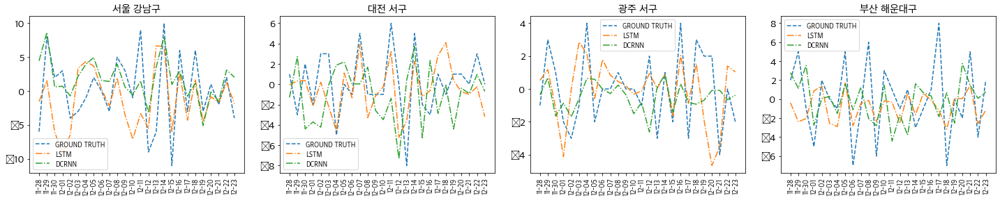

In [34]:
# select = ['서울 중구', '서울 서대문구', '서울 강남구', '인천 서구', '경기 파주시', '대전 서구', '충북 충주시', '충남 천안시', '세종 세종시', '전북 군산시', '광주 서구', '전남 순천시', '대구 달서구', '경북 경주시', '부산 해운대구', '경남 김해시', '강원 원주시', '제주 서귀포시', '울산 울주군']



region_dict = {}
for i, region in enumerate(GROUND_TRUTH[select].columns):
    region_dict[i] = region 
save_figure_predict(
                    # df = df,
                    GROUND_TRUTH = GROUND_TRUTH[select],
                    y_pred = [BASELINE[select], submit_01[select]],#, y_pred_2[select], y_pred_3[select], y_pred_4[select], y_pred_5[select]],#, y_pred_6, y_pred_7, y_pred_8],
                    region_dict = region_dict,
                    suptitle = '',
                    legend = ['GROUND TRUTH', 'LSTM', 'DCRNN', 'ASTGCN', 'STGCN', 'TGCN', 'GCN'],
                    date_split = None,
                    MAE = None, RMSE = None,
                    MAE_total = None, RMSE_total = None, 
                    PATH='Result/'
                    )
                    



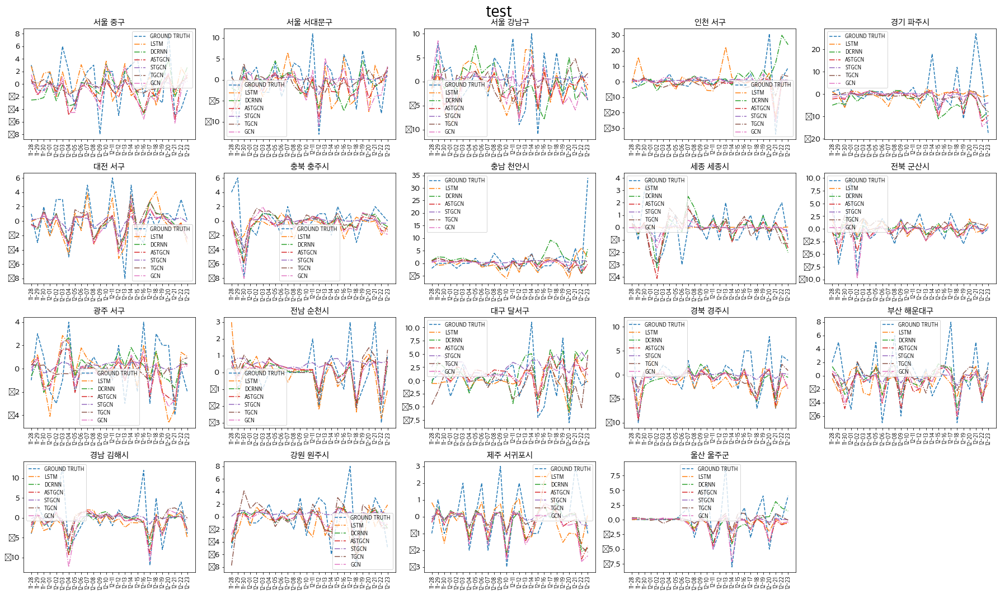

In [4]:
select = ['서울 중구', '서울 서대문구', '서울 강남구', '인천 서구', '경기 파주시', '대전 서구', '충북 충주시', '충남 천안시', '세종 세종시', '전북 군산시', '광주 서구', '전남 순천시', '대구 달서구', '경북 경주시', '부산 해운대구', '경남 김해시', '강원 원주시', '제주 서귀포시', '울산 울주군']

# select = ['서울 강남구', '대전 서구', '광주 서구', 부산 해운대구]



region_dict = {}
for i, region in enumerate(GROUND_TRUTH[select].columns):
    region_dict[i] = region 
save_figure_predict(
                    # df = df,
                    GROUND_TRUTH = GROUND_TRUTH[select],
                    y_pred = [BASELINE[select], y_pred_6[select], y_pred_7[select], y_pred_8[select], y_pred_9[select], y_pred_10[select]],#, y_pred_6, y_pred_7, y_pred_8],
                    region_dict = region_dict,
                    suptitle = '',
                    legend = ['GROUND TRUTH', 'LSTM', 'DCRNN', 'ASTGCN', 'STGCN', 'TGCN', 'GCN'],
                    date_split = None,
                    MAE = None, RMSE = None,
                    MAE_total = None, RMSE_total = None, 
                    PATH='Result/'
                    )

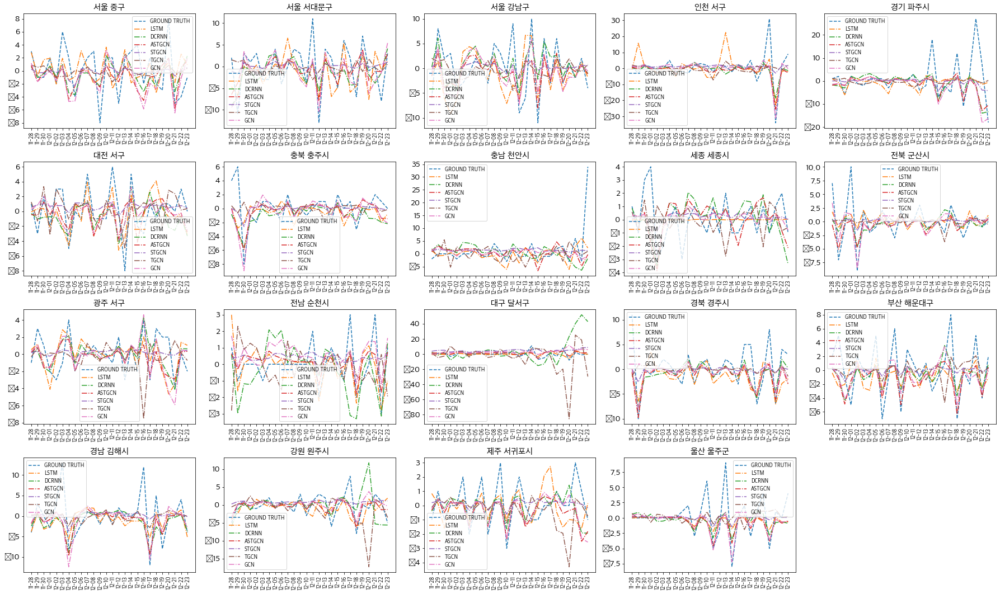

In [8]:
select = ['서울 중구', '서울 서대문구', '서울 강남구', '인천 서구', '경기 파주시', '대전 서구', '충북 충주시', '충남 천안시', '세종 세종시', '전북 군산시', '광주 서구', '전남 순천시', '대구 달서구', '경북 경주시', '부산 해운대구', '경남 김해시', '강원 원주시', '제주 서귀포시', '울산 울주군']

# select = ['서울 강남구', '대전 서구', ]



region_dict = {}
for i, region in enumerate(GROUND_TRUTH[select].columns):
    region_dict[i] = region 
save_figure_predict(
                    # df = df,
                    GROUND_TRUTH = GROUND_TRUTH[select],
                    y_pred = [BASELINE[select], y_pred_11[select], y_pred_12[select], y_pred_13[select], y_pred_14[select], y_pred_15[select]],#, y_pred_6, y_pred_7, y_pred_8],
                    region_dict = region_dict,
                    suptitle = '',
                    legend = ['GROUND TRUTH', 'LSTM', 'DCRNN', 'ASTGCN', 'STGCN', 'TGCN', 'GCN'],
                    date_split = None,
                    MAE = None, RMSE = None,
                    MAE_total = None, RMSE_total = None, 
                    PATH='Result/'
                    )

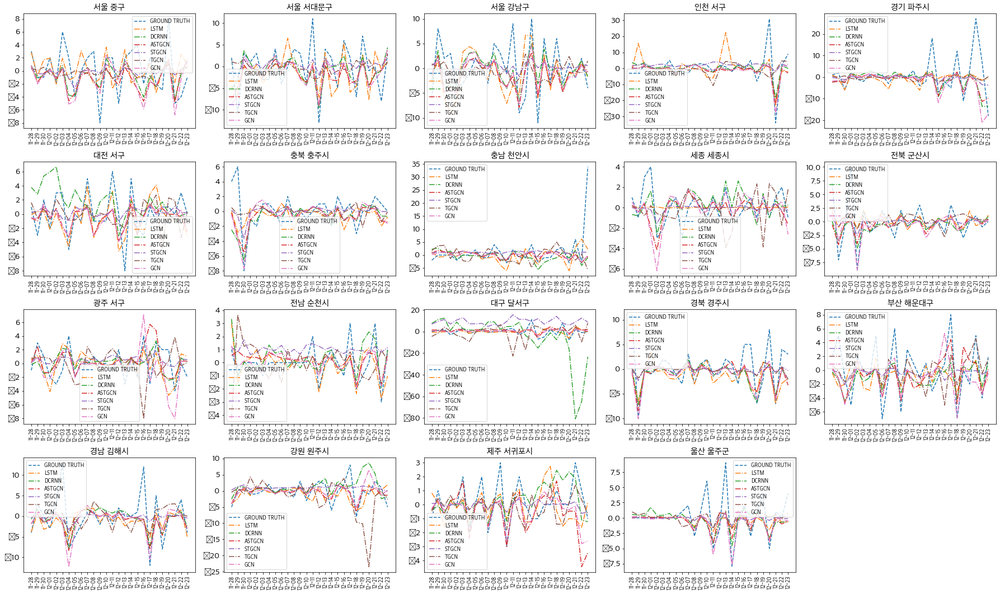

In [11]:
select = ['서울 중구', '서울 서대문구', '서울 강남구', '인천 서구', '경기 파주시', '대전 서구', '충북 충주시', '충남 천안시', '세종 세종시', '전북 군산시', '광주 서구', '전남 순천시', '대구 달서구', '경북 경주시', '부산 해운대구', '경남 김해시', '강원 원주시', '제주 서귀포시', '울산 울주군']

# select = ['서울 강남구', '대전 서구', ]



region_dict = {}
for i, region in enumerate(GROUND_TRUTH[select].columns):
    region_dict[i] = region 
save_figure_predict(
                    # df = df,
                    GROUND_TRUTH = GROUND_TRUTH[select],
                    y_pred = [BASELINE[select], y_pred_16[select], y_pred_17[select], y_pred_18[select], y_pred_19[select], y_pred_20[select]],#, y_pred_6, y_pred_7, y_pred_8],
                    region_dict = region_dict,
                    suptitle = '',
                    legend = ['GROUND TRUTH', 'LSTM', 'DCRNN', 'ASTGCN', 'STGCN', 'TGCN', 'GCN'],
                    date_split = None,
                    MAE = None, RMSE = None,
                    MAE_total = None, RMSE_total = None, 
                    PATH='Result/'
                    )

전체

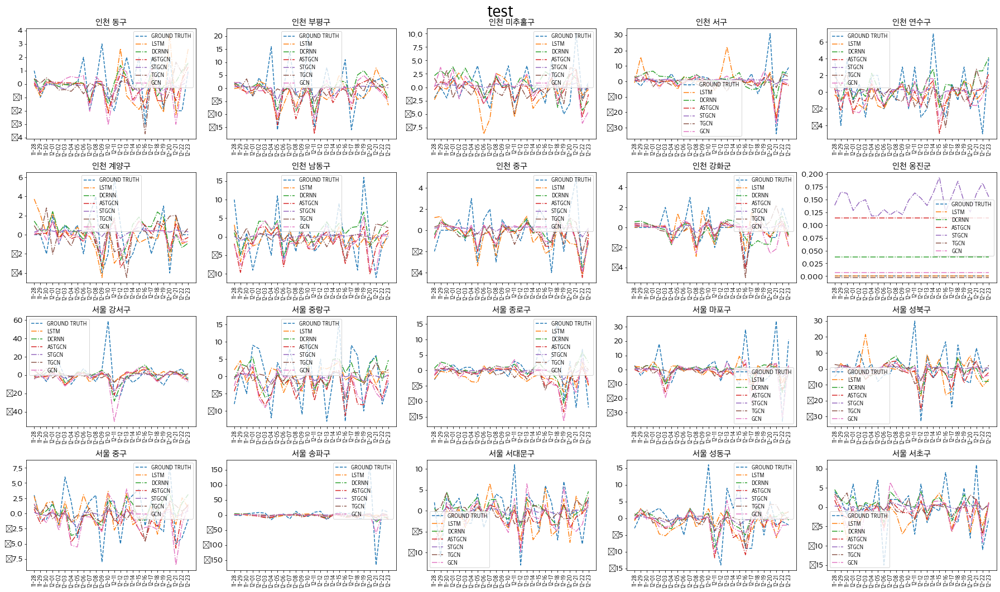

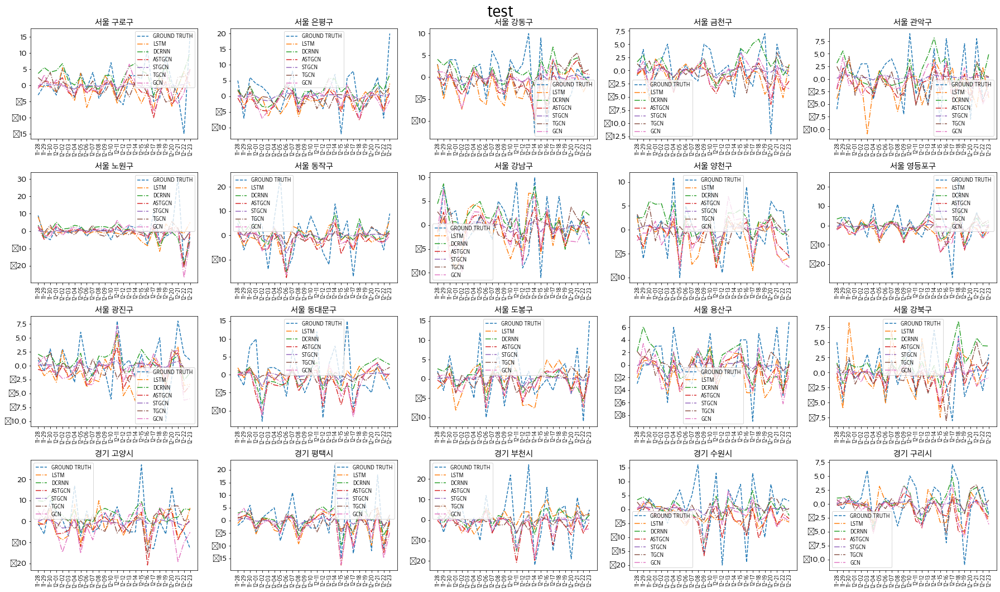

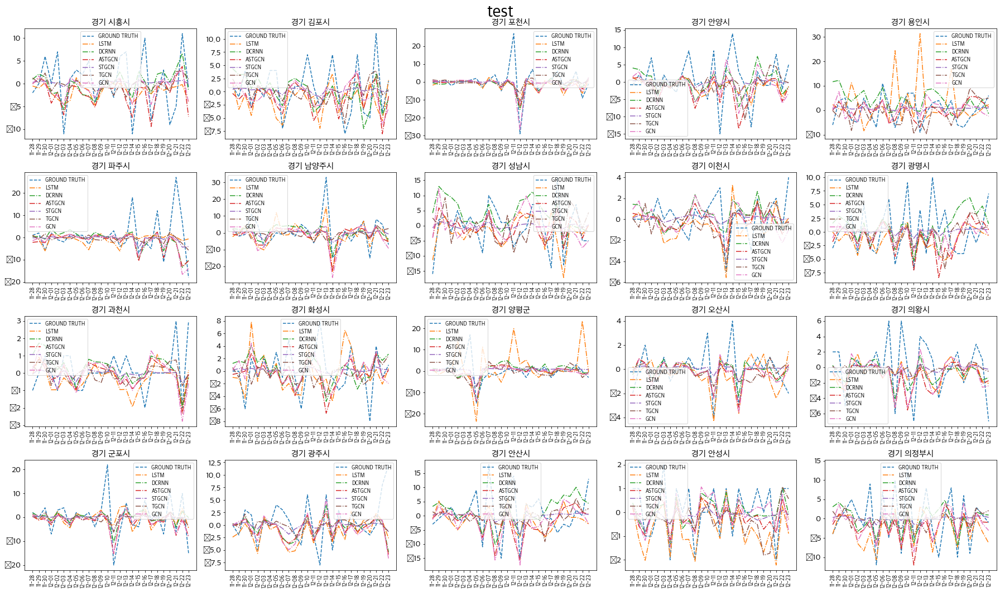

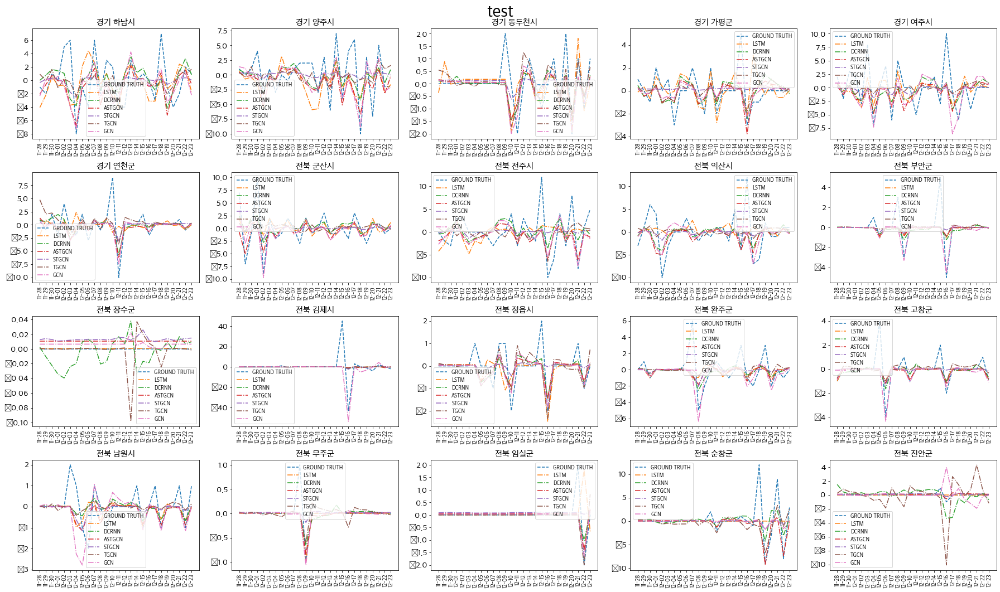

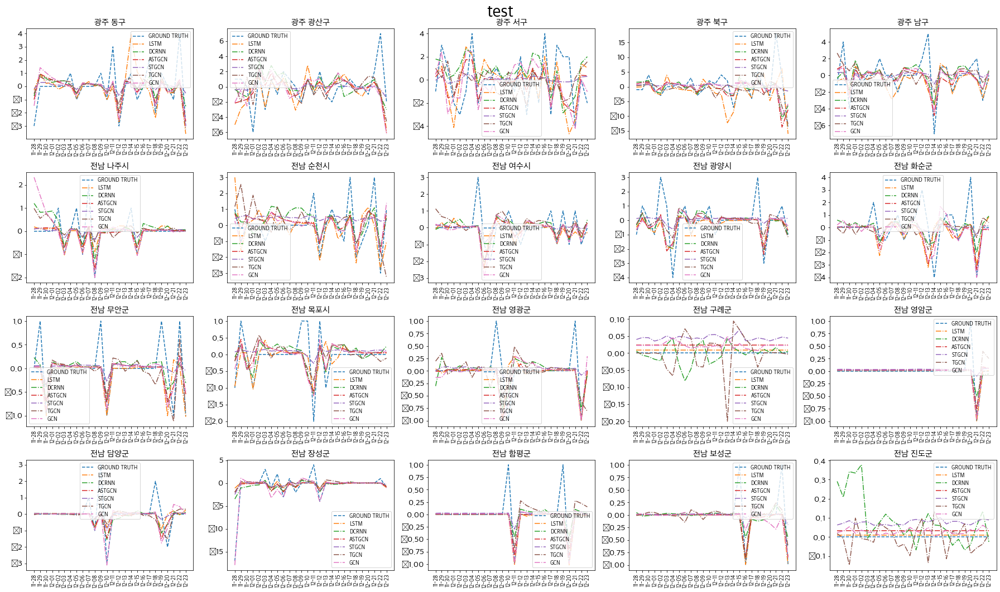

...

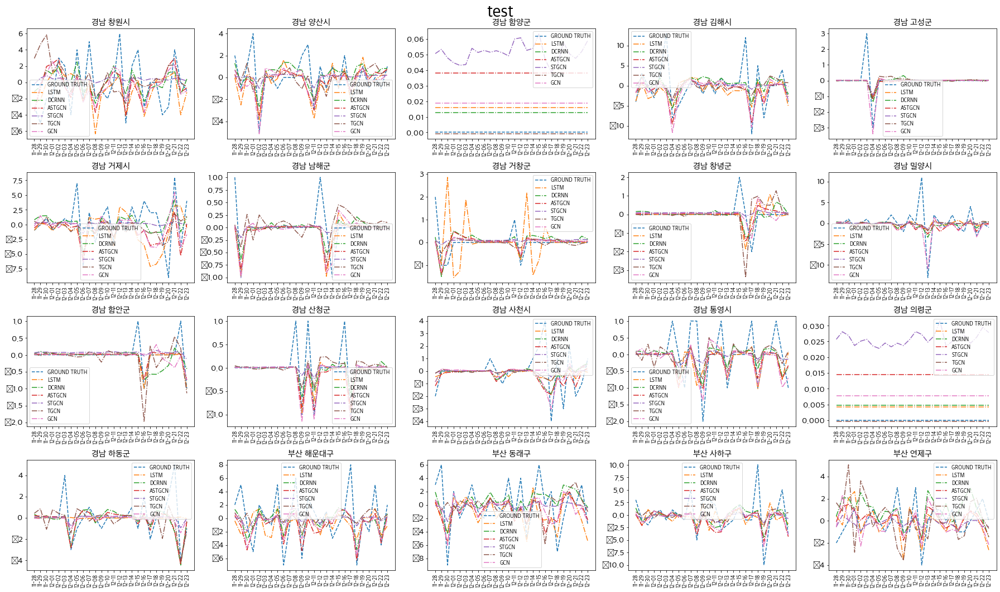

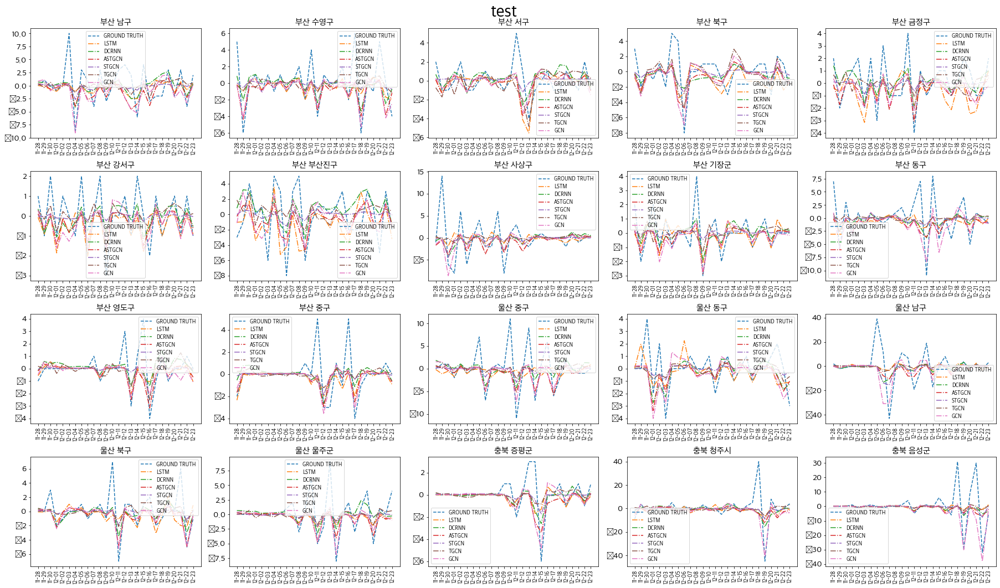

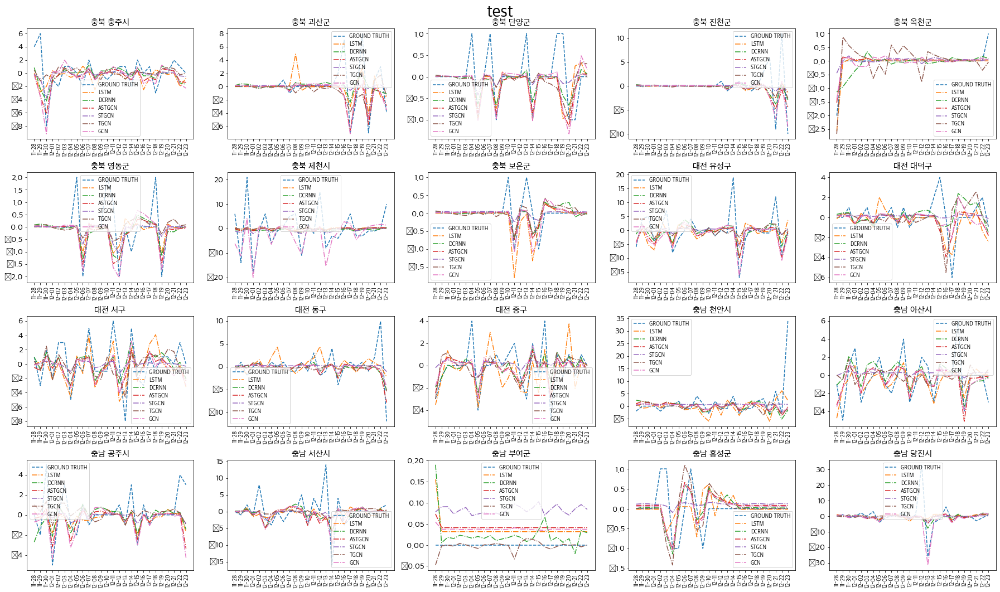

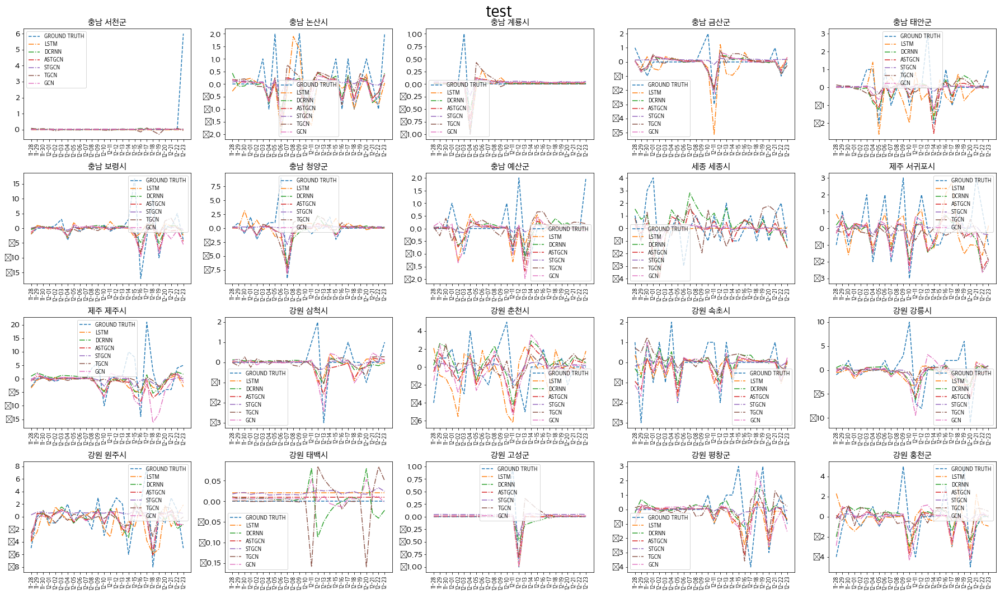

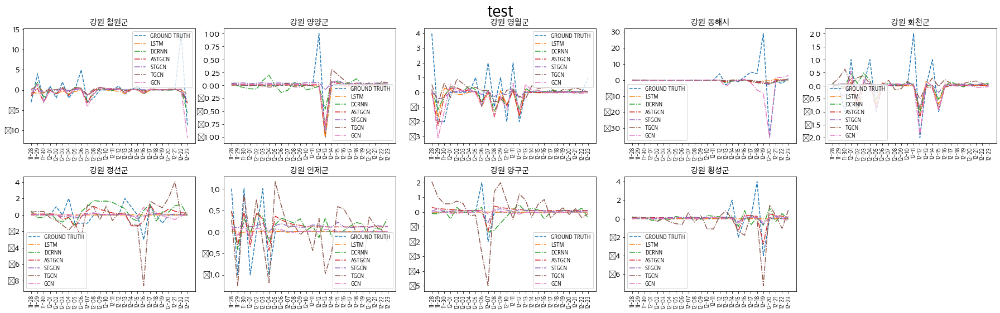

In [8]:
region_dict = {}
for i, region in enumerate(GROUND_TRUTH.columns):
    region_dict[i] = region 
save_figure_predict(
                    # df = df,
                    GROUND_TRUTH = GROUND_TRUTH,
                    y_pred = [BASELINE, y_pred_1, y_pred_2, y_pred_3, y_pred_4, y_pred_5],#, y_pred_6, y_pred_7, y_pred_8],
                    region_dict = region_dict,
                    suptitle = 'test',
                    legend = ['GROUND TRUTH', 'LSTM', 'DCRNN', 'ASTGCN', 'STGCN', 'TGCN', 'GCN'],
                    date_split = None,
                    MAE = None, RMSE = None,
                    MAE_total = None, RMSE_total = None, 
                    PATH='Result/'
                    )


In [72]:
for pred_PATH in glob('Result/26/*/**predict.csv'):
    pd.read_csv(pred_PATH, index_col=0, encoding='cp949')

['Result/26/ASTGCN_corr_0.7_1st/corr_city_0.7_predict.csv',
 'Result/26/ASTGCN_dist-corr_0.7_1st/dist-corr_city_0.7_predict.csv',
 'Result/26/ASTGCN_dist-cross_corr_0.7_1st/dist-cross_corr_city_0.7_predict.csv',
 'Result/26/GCN_dist_02_2_1st/dist_02_city_2_predict.csv',
 'Result/26/STGNN_dist-corr_0.9_1st/dist-corr_city_0.9_predict.csv',
 'Result/26/GCN2_dist-corr_0.7_1st/dist-corr_city_0.7_predict.csv',
 'Result/26/GCN_cross_corr_0.5_1st/cross_corr_city_0.5_predict.csv',
 'Result/26/STGCN_dist-corr_0.9_1st/dist-corr_city_0.9_predict.csv',
 'Result/26/ASTGCN_cross_corr-dist_0.3_1st/cross_corr-dist_city_0.3_predict.csv',
 'Result/26/STGCN_cross_corr-dist_0.5_1st/cross_corr-dist_city_0.5_predict.csv',
 'Result/26/ASTGCN_dist_01_0.9_1st/dist_01_city_0.9_predict.csv',
 'Result/26/DCRNN_dist_01_0.9_1st/dist_01_city_0.9_predict.csv',
 'Result/26/GCN_dist_02_1_1st/dist_02_city_1_predict.csv',
 'Result/26/ASTGCN_corr_0.5_1st/corr_city_0.5_predict.csv',
 'Result/26/STGCN_dist_01_0.9_1st/dist_01

# MAE, RMSE Plot

['Result/1129_com_id_3hop/Pred/169/GCN_identity_0_1st/total_metric_10.csv', 'Result/1129_com_id_3hop/Pred/169/GCN_identity_0_1st/total_metric_15.csv', 'Result/1129_com_id_3hop/Pred/169/GCN_identity_0_1st/total_metric_5.csv', 'Result/1129_com_id_3hop/Pred/169/GCN_identity_0_1st/total_metric_20.csv', 'Result/1129_com_id_3hop/Pred/322/GCN_identity_0_1st/total_metric_10.csv', 'Result/1129_com_id_3hop/Pred/322/GCN_identity_0_1st/total_metric_15.csv', 'Result/1129_com_id_3hop/Pred/322/GCN_identity_0_1st/total_metric_5.csv', 'Result/1129_com_id_3hop/Pred/322/GCN_identity_0_1st/total_metric_20.csv']
['Result/Baseline_707/Pred/169/RNN/RNN_total_metric.csv']
complete_0


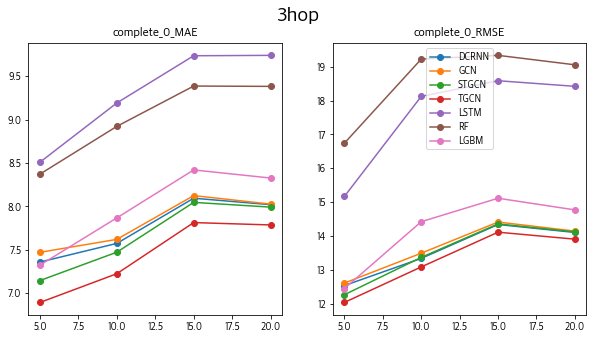

identity_0


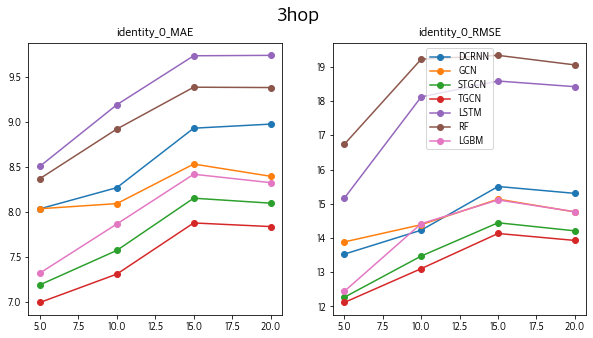

In [84]:
from glob import glob
import pandas as pd
import matplotlib.pyplot as plt

region_type = 'city'
df = pd.read_csv(f'Data/KCDC_data/Processing_Results/smoothing_1_{region_type}_mean.csv', index_col=0, encoding='cp949')
df = df.iloc[:850]

num=707
hop=3
# folder = f'1120_{num}_64_true_mul_{hop}hop'
# graph_list = ['corr_0.1', 'corr_0.2', 'corr_0.3', 'dist_01_0.6', 'dist_01_0.7', 'dist_01_0.8']
folder = f'1129_com_id_{hop}hop'
graph_list = ['complete_0', 'identity_0']

metric_list = []
for metric_PATH in glob(f'Result/{folder}/Pred/*/*/total_metric_*.csv'):
    # pd.read_csv(pred_PATH, index_col=0, encoding='cp949')
    metric_list.append(metric_PATH)
print(metric_list)
pred_10 = pd.read_csv(metric_list[0], index_col=0, encoding='cp949')
pred_15 = pd.read_csv(metric_list[1], index_col=0, encoding='cp949')
pred_5 = pd.read_csv(metric_list[2], index_col=0, encoding='cp949')
pred_20 = pd.read_csv(metric_list[3], index_col=0, encoding='cp949')

# lstm 경로 지정
LSTM_metric_PATH = glob(f'Result/Baseline_{num}/Pred/*/RNN/RNN_total_metric.csv')
print(LSTM_metric_PATH)
LSTM_pred = pd.read_csv(LSTM_metric_PATH[0], index_col=0, encoding='cp949')
for graph in graph_list:
    print(graph)
    process_and_plot(pred_5, pred_10, pred_15, pred_20, LSTM_pred, graph_type=graph, suptitle_=f'{hop}hop')

In [83]:
def process_and_plot(pred_5, pred_10, pred_15, pred_20, LSTM_pred, graph_type, suptitle_):

    DCRNN_MAE_mul = pd.DataFrame({}, columns=pred_10.index, index=[5, 10, 15, 20])
    DCRNN_MAE_mul.loc[10,:] = pred_10[['DCRNN_MAE']].values.reshape(1,-1)
    DCRNN_MAE_mul.loc[5,:] = pred_5[['DCRNN_MAE']].values.reshape(1,-1)
    DCRNN_MAE_mul.loc[15,:] = pred_15[['DCRNN_MAE']].values.reshape(1,-1)
    DCRNN_MAE_mul.loc[20,:] = pred_20[['DCRNN_MAE']].values.reshape(1,-1)

    DCRNN_RMSE_mul = pd.DataFrame({}, columns=pred_10.index, index=[5, 10, 15, 20])
    DCRNN_RMSE_mul.loc[10,:] = pred_10[['DCRNN_RMSE']].values.reshape(1,-1)
    DCRNN_RMSE_mul.loc[5,:] = pred_5[['DCRNN_RMSE']].values.reshape(1,-1)
    DCRNN_RMSE_mul.loc[15,:] = pred_15[['DCRNN_RMSE']].values.reshape(1,-1)
    DCRNN_RMSE_mul.loc[20,:] = pred_20[['DCRNN_RMSE']].values.reshape(1,-1)

    # ASTGCN_MAE_mul = pd.DataFrame({}, columns=pred_10.index, index=[5, 10, 15, 20])
    # ASTGCN_MAE_mul.loc[10,:] = pred_10[['ASTGCN_MAE']].values.reshape(1,-1)
    # ASTGCN_MAE_mul.loc[5,:] = pred_5[['ASTGCN_MAE']].values.reshape(1,-1)
    # ASTGCN_MAE_mul.loc[15,:] = pred_15[['ASTGCN_MAE']].values.reshape(1,-1)
    # ASTGCN_MAE_mul.loc[20,:] = pred_20[['ASTGCN_MAE']].values.reshape(1,-1)

    # ASTGCN_RMSE_mul = pd.DataFrame({}, columns=pred_10.index, index=[5, 10, 15, 20])
    # ASTGCN_RMSE_mul.loc[10,:] = pred_10[['ASTGCN_RMSE']].values.reshape(1,-1)
    # ASTGCN_RMSE_mul.loc[5,:] = pred_5[['ASTGCN_RMSE']].values.reshape(1,-1)
    # ASTGCN_RMSE_mul.loc[15,:] = pred_15[['ASTGCN_RMSE']].values.reshape(1,-1)
    # ASTGCN_RMSE_mul.loc[20,:] = pred_20[['ASTGCN_RMSE']].values.reshape(1,-1)

    TGCN_MAE_mul = pd.DataFrame({}, columns=pred_10.index, index=[5, 10, 15, 20])
    TGCN_MAE_mul.loc[10,:] = pred_10[['TGCN_MAE']].values.reshape(1,-1)
    TGCN_MAE_mul.loc[5,:] = pred_5[['TGCN_MAE']].values.reshape(1,-1)
    TGCN_MAE_mul.loc[15,:] = pred_15[['TGCN_MAE']].values.reshape(1,-1)
    TGCN_MAE_mul.loc[20,:] = pred_20[['TGCN_MAE']].values.reshape(1,-1)

    TGCN_RMSE_mul = pd.DataFrame({}, columns=pred_10.index, index=[5, 10, 15, 20])
    TGCN_RMSE_mul.loc[10,:] = pred_10[['TGCN_RMSE']].values.reshape(1,-1)
    TGCN_RMSE_mul.loc[5,:] = pred_5[['TGCN_RMSE']].values.reshape(1,-1)
    TGCN_RMSE_mul.loc[15,:] = pred_15[['TGCN_RMSE']].values.reshape(1,-1)
    TGCN_RMSE_mul.loc[20,:] = pred_20[['TGCN_RMSE']].values.reshape(1,-1)

    STGCN_MAE_mul = pd.DataFrame({}, columns=pred_10.index, index=[5, 10, 15, 20])
    STGCN_MAE_mul.loc[10,:] = pred_10[['STGCN_MAE']].values.reshape(1,-1)
    STGCN_MAE_mul.loc[5,:] = pred_5[['STGCN_MAE']].values.reshape(1,-1)
    STGCN_MAE_mul.loc[15,:] = pred_15[['STGCN_MAE']].values.reshape(1,-1)
    STGCN_MAE_mul.loc[20,:] = pred_20[['STGCN_MAE']].values.reshape(1,-1)

    STGCN_RMSE_mul = pd.DataFrame({}, columns=pred_10.index, index=[5, 10, 15, 20])
    STGCN_RMSE_mul.loc[10,:] = pred_10[['STGCN_RMSE']].values.reshape(1,-1)
    STGCN_RMSE_mul.loc[5,:] = pred_5[['STGCN_RMSE']].values.reshape(1,-1)
    STGCN_RMSE_mul.loc[15,:] = pred_15[['STGCN_RMSE']].values.reshape(1,-1)
    STGCN_RMSE_mul.loc[20,:] = pred_20[['STGCN_RMSE']].values.reshape(1,-1)

    GCN_MAE_mul = pd.DataFrame({}, columns=pred_10.index, index=[5, 10, 15, 20])
    GCN_MAE_mul.loc[10,:] = pred_10[['GCN_MAE']].values.reshape(1,-1)
    GCN_MAE_mul.loc[5,:] = pred_5[['GCN_MAE']].values.reshape(1,-1)
    GCN_MAE_mul.loc[15,:] = pred_15[['GCN_MAE']].values.reshape(1,-1)
    GCN_MAE_mul.loc[20,:] = pred_20[['GCN_MAE']].values.reshape(1,-1)

    GCN_RMSE_mul = pd.DataFrame({}, columns=pred_10.index, index=[5, 10, 15, 20])
    GCN_RMSE_mul.loc[10,:] = pred_10[['GCN_RMSE']].values.reshape(1,-1)
    GCN_RMSE_mul.loc[5,:] = pred_5[['GCN_RMSE']].values.reshape(1,-1)
    GCN_RMSE_mul.loc[15,:] = pred_15[['GCN_RMSE']].values.reshape(1,-1)
    GCN_RMSE_mul.loc[20,:] = pred_20[['GCN_RMSE']].values.reshape(1,-1)

    LSTM_MAE_mul = pd.DataFrame({}, columns = ['LSTM'], index=[5, 10, 15, 20])
    LSTM_MAE_mul.loc[5,:] = LSTM_pred['MAE_total_5']
    LSTM_MAE_mul.loc[10,:] = LSTM_pred['MAE_total_10']
    LSTM_MAE_mul.loc[15,:] = LSTM_pred['MAE_total_15']
    LSTM_MAE_mul.loc[20,:] = LSTM_pred['MAE_total_20']

    LSTM_RMSE_mul = pd.DataFrame({}, columns = ['LSTM'], index=[5, 10, 15, 20])
    LSTM_RMSE_mul.loc[5,:] = LSTM_pred['RMSE_total_5']
    LSTM_RMSE_mul.loc[10,:] = LSTM_pred['RMSE_total_10']
    LSTM_RMSE_mul.loc[15,:] = LSTM_pred['RMSE_total_15']
    LSTM_RMSE_mul.loc[20,:] = LSTM_pred['RMSE_total_20']


    # plot
    fig, ax = plt.subplots(ncols=2, nrows=1, figsize=(10,5))

    DCRNN_MAE_mul[graph_type].plot(ax=ax[0],style='-o')
    # ASTGCN_MAE_mul[graph_type].plot(ax=ax[0],style= '-o')
    GCN_MAE_mul[graph_type].plot(ax=ax[0],style= '-o')
    STGCN_MAE_mul[graph_type].plot(ax=ax[0],style= '-o')
    TGCN_MAE_mul[graph_type].plot(ax=ax[0],style= '-o')
    LSTM_MAE_mul['LSTM'].plot(ax=ax[0],style= '-o')
    ax[0].plot([5, 10, 15, 20], [8.372014783176297, 8.922156323460635, 9.386886599399148, 9.382971707035722], '-o')
    ax[0].plot([5, 10, 15, 20], [7.322851043946682, 7.8673458181991345, 8.419999376323656, 8.326557793405637], '-o')
    # plt.legend(['DCRNN', 'ASTGCN', 'GCN', 'STGCN', 'TGCN'])
    ax[0].set_title(f'{graph_type}_MAE')
    

    DCRNN_RMSE_mul[graph_type].plot(ax=ax[1],style='-o')
    # ASTGCN_RMSE_mul[graph_type].plot(ax=ax[1],style='-o')
    GCN_RMSE_mul[graph_type].plot(ax=ax[1],style='-o')
    STGCN_RMSE_mul[graph_type].plot(ax=ax[1],style='-o')
    TGCN_RMSE_mul[graph_type].plot(ax=ax[1],style='-o')
    LSTM_RMSE_mul['LSTM'].plot(ax=ax[1],style= '-o')
    ax[1].plot([5, 10, 15, 20], [16.737602398005272, 19.222847023307896, 19.33468251201428, 19.05546216179487], '-o')
    ax[1].plot([5, 10, 15, 20], [12.442720576092213, 14.419308959829623, 15.11247173219228, 14.768118136766981], '-o')
    # plt.legend(['DCRNN', 'ASTGCN', 'GCN', 'STGCN', 'TGCN', 'LSTM'])
    plt.legend(['DCRNN', 'GCN', 'STGCN', 'TGCN', 'LSTM', 'RF', 'LGBM'])
    ax[1].set_title(f'{graph_type}_RMSE')
    plt.suptitle(suptitle_, fontsize=20)
    
    # gpr_mae = [7.107073195711559, 7.4113178223999014, 8.013594657446305, 8.00558656297911]
    # gpr_rmse = [12.280451154821934, 13.199618433388705, 14.454355192685922, 14.277592739628027]

    # lgbm_mae = [6.9186694162652325, 7.248742364356688, 7.830907105898855, 7.79532842851798]
    # lgbm_rmse = [12.068252858073949, 13.119632209765527, 14.130079314800758, 13.906026064111114]

    # plt.plot([5, 10, 15, 20], gpr_mae, '-o')
    # plt.plot([5, 10, 15, 20], lgbm_mae, '-o')
    # plt.legend(['GaussianProcess', 'LGBMRegressor'])
    # plt.show()

    # plt.plot([5, 10, 15, 20], gpr_rmse, '-o')
    # plt.plot([5, 10, 15, 20], lgbm_rmse, '-o')
    # plt.legend(['GaussianProcess', 'LGBMRegressor'])
    # plt.show()
    
    plt.show()

# Multi Step Ahead Result Plot

['Result/1129_com_id_3hop/Pred/169/GCN_complete_0_1st/complete_city_0_predict_20.csv', 'Result/1129_com_id_3hop/Pred/169/DCRNN_complete_0_1st/complete_city_0_predict_20.csv', 'Result/1129_com_id_3hop/Pred/169/TGCN_complete_0_1st/complete_city_0_predict_20.csv', 'Result/1129_com_id_3hop/Pred/169/STGCN_complete_0_1st/complete_city_0_predict_20.csv', 'Result/1129_com_id_3hop/Pred/322/GCN_complete_0_1st/complete_city_0_predict_20.csv', 'Result/1129_com_id_3hop/Pred/322/DCRNN_complete_0_1st/complete_city_0_predict_20.csv', 'Result/1129_com_id_3hop/Pred/322/TGCN_complete_0_1st/complete_city_0_predict_20.csv', 'Result/1129_com_id_3hop/Pred/322/STGCN_complete_0_1st/complete_city_0_predict_20.csv']
['Result/Baseline_707/Pred/169/RNN/RNN_predict_20.csv']
['Result/1129_com_id_3hop/Pred/169/STGCN_identity_0_1st/identity_city_0_predict_20.csv', 'Result/1129_com_id_3hop/Pred/169/TGCN_identity_0_1st/identity_city_0_predict_20.csv', 'Result/1129_com_id_3hop/Pred/169/DCRNN_identity_0_1st/identity_city_

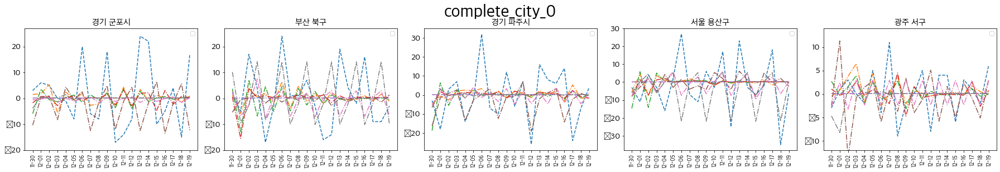

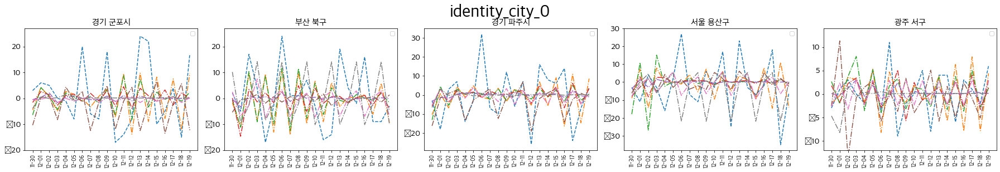

In [2]:
from glob import glob
import pandas as pd
import matplotlib.pyplot as plt
from lib import save_figure_predict
from lib import save_figure_predict, matplotlib_plot_font
import pandas as pd
import warnings
warnings.filterwarnings('ignore')
matplotlib_plot_font()

num=707
hop=3
# folder = f'1120_{num}_64_true_mul_{hop}hop'
# graph_list = ['corr_city_0.1', 'corr_city_0.2', 'dist_01_city_0.6', 'dist_01_city_0.8']
folder = f'1129_com_id_{hop}hop'
graph_list = ['complete_city_0', 'identity_city_0']

gt_path = glob(f'Result/{folder}/Pred/*/*/ground_truth.csv')
GROUND_TRUTH = pd.read_csv(gt_path[0], index_col=0, encoding='cp949')
GROUND_TRUTH = GROUND_TRUTH.iloc[:20,:]

metric_df = pd.DataFrame(index=graph_list)
DCRNN_metric = pd.DataFrame(index=GROUND_TRUTH.columns)
TGCN_metric = pd.DataFrame(index=GROUND_TRUTH.columns)
STGCN_metric = pd.DataFrame(index=GROUND_TRUTH.columns)
LSTM_metric = pd.DataFrame(index=GROUND_TRUTH.columns)
GCN_metric = pd.DataFrame(index=GROUND_TRUTH.columns)
LGBM_pred_20 = pd.read_csv(glob(f'Result/RF_test/Pred/*/GP/lgbm_predict.csv')[0], index_col=0, encoding='cp949')
RF_pred_20 = pd.read_csv(glob(f'Result/RF_test/Pred/*/GP/rf_predict.csv')[0], index_col=0, encoding='cp949')
# graph = 'dist_01_city_0.7'#'corr_city_0.1'
for graph in graph_list:
    metric_list = []
    for metric_PATH in glob(f'Result/{folder}/Pred/*/*/*{graph}_predict_20.csv'):
        # pd.read_csv(pred_PATH, index_col=0, encoding='cp949')
        metric_list.append(metric_PATH)
    print(metric_list)

    # DCRNN_pred_20 = pd.read_csv(metric_list[0], index_col=0, encoding='cp949')
    # # STGNN_pred_20 = pd.read_csv(metric_list[1], index_col=0, encoding='cp949')
    # GCN_pred_20 = pd.read_csv(metric_list[2], index_col=0, encoding='cp949')
    # STGCN_pred_20 = pd.read_csv(metric_list[3], index_col=0, encoding='cp949')
    # TGCN_pred_20 = pd.read_csv(metric_list[4], index_col=0, encoding='cp949')

    MODEL = ['DCRNN', 'GCN', 'STGCN', 'TGCN']
    DCRNN_pred_20 = pd.read_csv(glob(f'Result/{folder}/Pred/*/{MODEL[0]}*/*{graph}_predict_20.csv')[0], index_col=0, encoding='cp949')
    GCN_pred_20 = pd.read_csv(glob(f'Result/{folder}/Pred/*/{MODEL[1]}*/*{graph}_predict_20.csv')[0], index_col=0, encoding='cp949')
    STGCN_pred_20 = pd.read_csv(glob(f'Result/{folder}/Pred/*/{MODEL[2]}*/*{graph}_predict_20.csv')[0], index_col=0, encoding='cp949')
    TGCN_pred_20 = pd.read_csv(glob(f'Result/{folder}/Pred/*/{MODEL[3]}*/*{graph}_predict_20.csv')[0], index_col=0, encoding='cp949')




    LSTM_metric_PATH = glob(f'Result/Baseline_{num}/Pred/*/RNN/RNN_predict_20.csv')
    print(LSTM_metric_PATH)
    LSTM_pred_20 = pd.read_csv(LSTM_metric_PATH[0], index_col=0, encoding='cp949')
    LGBM_pred_20 = pd.read_csv(glob(f'Result/RF_test/Pred/*/GP/lgbm_predict.csv')[0], index_col=0, encoding='cp949').iloc[:20]
    RF_pred_20 = pd.read_csv(glob(f'Result/RF_test/Pred/*/GP/rf_predict.csv')[0], index_col=0, encoding='cp949').iloc[:20]

    gt_path = glob(f'Result/{folder}/Pred/*/*/ground_truth.csv')
    GROUND_TRUTH = pd.read_csv(gt_path[0], index_col=0, encoding='cp949')
    GROUND_TRUTH = GROUND_TRUTH.iloc[:20,:]


    # select = ['서울 중구', '서울 서대문구', '서울 강남구', '인천 서구', '경기 파주시', '대전 서구', '충북 충주시', '충남 천안시', '세종 세종시', '전북 군산시', '광주 서구', '전남 순천시', '대구 달서구', '경북 경주시', '부산 해운대구', '경남 김해시', '강원 원주시', '제주 서귀포시', '울산 울주군']
    select = ['경기 군포시', '부산 북구', '경기 파주시', '서울 용산구', '광주 서구']#, '제주 서귀포시']
    res_ = 0
    # res_ = df.iloc[313:313+20].values
    # res_ = df.iloc[527:527+20].values
    region_dict = {}
    for i, region in enumerate(GROUND_TRUTH[select].columns):
        region_dict[i] = region 
    save_figure_predict(
                        # df = df,
                        GROUND_TRUTH = GROUND_TRUTH[select],
                        y_pred = [DCRNN_pred_20[select], GCN_pred_20[select], STGCN_pred_20[select], TGCN_pred_20[select], LSTM_pred_20[select].iloc[:20,:], LGBM_pred_20, RF_pred_20],
                        region_dict = region_dict,
                        suptitle = graph,
                        legend = [],#['GROUND TRUTH', 'DCRNN', 'GCN', 'STGCN', 'TGCN', 'LSTM', 'LGBM', 'RF'],
                        date_split = None,
                        MAE = None, RMSE = None,
                        MAE_total = None, RMSE_total = None, 
                        PATH='Result/'
                        )
    
    # DR, DCRNN_RMSE = compute_metrics(GROUND_TRUTH, DCRNN_pred_20.iloc[:20,:], metric='rmse')
    # DM, DCRNN_MAE = compute_metrics(GROUND_TRUTH, DCRNN_pred_20.iloc[:20,:], metric='mae')
    # SR, STGCN_RMSE = compute_metrics(GROUND_TRUTH, STGCN_pred_20.iloc[:20,:], metric='rmse')
    # SM, STGCN_MAE = compute_metrics(GROUND_TRUTH, STGCN_pred_20.iloc[:20,:], metric='mae')
    # TR, TGCN_RMSE = compute_metrics(GROUND_TRUTH, TGCN_pred_20.iloc[:20,:], metric='rmse')
    # TM, TGCN_MAE = compute_metrics(GROUND_TRUTH, TGCN_pred_20.iloc[:20,:], metric='mae')
    # GR, GCN_RMSE = compute_metrics(GROUND_TRUTH, GCN_pred_20.iloc[:20,:], metric='rmse')
    # GM, GCN_MAE = compute_metrics(GROUND_TRUTH, GCN_pred_20.iloc[:20,:], metric='mae')
    # LR, LSTM_RMSE = compute_metrics(GROUND_TRUTH, LSTM_pred_20.iloc[:20,:], metric='rmse')
    # LM, LSTM_MAE = compute_metrics(GROUND_TRUTH, LSTM_pred_20.iloc[:20,:], metric='mae')
    
    # DCRNN_metric.loc[:,'MAE'] = DM
    # DCRNN_metric.loc[:,'RMSE'] = DR
    # GCN_metric.loc[:,'MAE'] = GM
    # GCN_metric.loc[:,'RMSE'] = GR
    # STGCN_metric.loc[:,'MAE'] = SM
    # STGCN_metric.loc[:,'RMSE'] = SR
    # LSTM_metric.loc[:,'MAE'] = LM
    # LSTM_metric.loc[:,'RMSE'] = LR
    # TGCN_metric.loc[:,'MAE'] = TM
    # TGCN_metric.loc[:,'RMSE'] = TR
    # DCRNN_metric.to_csv(f'Result/metric_707/DCRNN_{graph}_{hop}hop.csv', encoding='cp949')
    # GCN_metric.to_csv(f'Result/metric_707/GCN_{graph}_{hop}hop.csv', encoding='cp949')
    # STGCN_metric.to_csv(f'Result/metric_707/STGCN_{graph}_{hop}hop.csv', encoding='cp949')
    # LSTM_metric.to_csv(f'Result/metric_707/LSTM_{graph}_{hop}hop.csv', encoding='cp949')
    # TGCN_metric.to_csv(f'Result/metric_707/TGCN_{graph}_{hop}hop.csv', encoding='cp949')

# test data plot and calculate metric

In [109]:
from glob import glob
import pandas as pd
import matplotlib.pyplot as plt
from lib import save_figure_predict, matplotlib_plot_font, compute_metrics
import pandas as pd
import warnings
warnings.filterwarnings('ignore')
matplotlib_plot_font()

num=707
hop=3
folder = f'1120_{num}_64_true_mul_{hop}hop'
# folder = f'1120_{num}_64_true_mul_2hop'
graph_list = ['corr_city_0.1', 'corr_city_0.2', 'corr_city_0.3', 'dist_01_city_0.6', 'dist_01_city_0.7', 'dist_01_city_0.8']
metric_df = pd.DataFrame(index=graph_list)

gt_path = glob(f'Result/{folder}/Pred/*/*/ground_truth.csv')
GROUND_TRUTH = pd.read_csv(gt_path[0], index_col=0, encoding='cp949')
GROUND_TRUTH = GROUND_TRUTH.iloc[:20,:]

DCRNN_metric = pd.DataFrame(index=GROUND_TRUTH.columns)
TGCN_metric = pd.DataFrame(index=GROUND_TRUTH.columns)
STGCN_metric = pd.DataFrame(index=GROUND_TRUTH.columns)
LSTM_metric = pd.DataFrame(index=GROUND_TRUTH.columns)
GCN_metric = pd.DataFrame(index=GROUND_TRUTH.columns)
# graph = 'dist_01_city_0.7'#'corr_city_0.1'
for graph in graph_list:
    metric_list = []
    for metric_PATH in glob(f'Result/{folder}/Pred/*/*/*{graph}_predict.csv'):
        # pd.read_csv(pred_PATH, index_col=0, encoding='cp949')
        metric_list.append(metric_PATH)
    # print(metric_list)

    MODEL = ['DCRNN', 'GCN', 'STGCN', 'TGCN']
    DCRNN_pred_20 = pd.read_csv(glob(f'Result/{folder}/Pred/*/{MODEL[0]}*/*{graph}_predict.csv')[0], index_col=0, encoding='cp949')
    GCN_pred_20 = pd.read_csv(glob(f'Result/{folder}/Pred/*/{MODEL[1]}*/*{graph}_predict.csv')[0], index_col=0, encoding='cp949')
    STGCN_pred_20 = pd.read_csv(glob(f'Result/{folder}/Pred/*/{MODEL[2]}*/*{graph}_predict.csv')[0], index_col=0, encoding='cp949')
    TGCN_pred_20 = pd.read_csv(glob(f'Result/{folder}/Pred/*/{MODEL[3]}*/*{graph}_predict.csv')[0], index_col=0, encoding='cp949')


    LSTM_metric_PATH = glob(f'Result/Baseline_{num}/Pred/*/RNN/pred_LSTM_city.csv')
    # print(LSTM_metric_PATH)
    LSTM_pred_20 = pd.read_csv(LSTM_metric_PATH[0], index_col=0, encoding='cp949')

    gt_path = glob(f'Result/{folder}/Pred/*/*/ground_truth.csv')
    GROUND_TRUTH = pd.read_csv(gt_path[0], index_col=0, encoding='cp949')
    GROUND_TRUTH = GROUND_TRUTH.iloc[:20,:]


    # select = ['서울 중구', '서울 서대문구', '서울 강남구', '인천 서구', '경기 파주시', '대전 서구', '충북 충주시', '충남 천안시', '세종 세종시', '전북 군산시', '광주 서구', '전남 순천시', '대구 달서구', '경북 경주시', '부산 해운대구', '경남 김해시', '강원 원주시', '제주 서귀포시', '울산 울주군']
    select = ['경기 군포시', '부산 북구', '경기 파주시', '서울 용산구', '광주 서구']#, '제주 서귀포시']
    res_ = 0
    # res_ = df.iloc[313:313+20].values
    # res_ = df.iloc[527:527+20].values
    region_dict = {}
    for i, region in enumerate(GROUND_TRUTH[select].columns):
        region_dict[i] = region 
    # save_figure_predict(
    #                     # df = df,
    #                     GROUND_TRUTH = GROUND_TRUTH[select].iloc[:30,:] + res_,
    #                     y_pred = [DCRNN_pred_20[select].iloc[:30,:] + res_, GCN_pred_20[select].iloc[:30,:] + res_, STGCN_pred_20[select].iloc[:30,:] + res_, TGCN_pred_20[select].iloc[:30,:] + res_, LSTM_pred_20[select].iloc[:30,:] + res_],
    #                     region_dict = region_dict,
    #                     suptitle = graph,
    #                     legend = [],#['GROUND TRUTH', 'DCRNN', 'GCN', 'STGCN', 'TGCN', 'LSTM'],
    #                     date_split = None,
    #                     MAE = None, RMSE = None,
    #                     MAE_total = None, RMSE_total = None, 
    #                     PATH='Result/'
    #                     )

    DR, DCRNN_RMSE = compute_metrics(GROUND_TRUTH, DCRNN_pred_20.iloc[:20,:], metric='rmse')
    DM, DCRNN_MAE = compute_metrics(GROUND_TRUTH, DCRNN_pred_20.iloc[:20,:], metric='mae')
    SR, STGCN_RMSE = compute_metrics(GROUND_TRUTH, STGCN_pred_20.iloc[:20,:], metric='rmse')
    SM, STGCN_MAE = compute_metrics(GROUND_TRUTH, STGCN_pred_20.iloc[:20,:], metric='mae')
    TR, TGCN_RMSE = compute_metrics(GROUND_TRUTH, TGCN_pred_20.iloc[:20,:], metric='rmse')
    TM, TGCN_MAE = compute_metrics(GROUND_TRUTH, TGCN_pred_20.iloc[:20,:], metric='mae')
    GR, GCN_RMSE = compute_metrics(GROUND_TRUTH, GCN_pred_20.iloc[:20,:], metric='rmse')
    GM, GCN_MAE = compute_metrics(GROUND_TRUTH, GCN_pred_20.iloc[:20,:], metric='mae')
    LR, LSTM_RMSE = compute_metrics(GROUND_TRUTH, LSTM_pred_20.iloc[:20,:], metric='rmse')
    LM, LSTM_MAE = compute_metrics(GROUND_TRUTH, LSTM_pred_20.iloc[:20,:], metric='mae')

    metric_df.loc[graph, 'DCRNN_MAE'] = DCRNN_MAE
    metric_df.loc[graph, 'DCRNN_RMSE'] = DCRNN_RMSE
    metric_df.loc[graph, 'STGCN_MAE'] = STGCN_MAE
    metric_df.loc[graph, 'STGCN_RMSE'] = STGCN_RMSE
    metric_df.loc[graph, 'TGCN_MAE'] = TGCN_MAE
    metric_df.loc[graph, 'TGCN_RMSE'] = TGCN_RMSE
    metric_df.loc[graph, 'GCN_MAE'] = GCN_MAE
    metric_df.loc[graph, 'GCN_RMSE'] = GCN_RMSE
    print(LSTM_MAE, LSTM_RMSE)
    
    DCRNN_metric.loc[:,'MAE'] = DM
    DCRNN_metric.loc[:,'RMSE'] = DR
    GCN_metric.loc[:,'MAE'] = GM
    GCN_metric.loc[:,'RMSE'] = GR
    STGCN_metric.loc[:,'MAE'] = SM
    STGCN_metric.loc[:,'RMSE'] = SR
    LSTM_metric.loc[:,'MAE'] = LM
    LSTM_metric.loc[:,'RMSE'] = LR
    TGCN_metric.loc[:,'MAE'] = TM
    TGCN_metric.loc[:,'RMSE'] = TR
    DCRNN_metric.to_csv(f'Result/metric_707/DCRNN_{graph}_{hop}hop.csv', encoding='cp949')
    GCN_metric.to_csv(f'Result/metric_707/GCN_{graph}_{hop}hop.csv', encoding='cp949')
    STGCN_metric.to_csv(f'Result/metric_707/STGCN_{graph}_{hop}hop.csv', encoding='cp949')
    LSTM_metric.to_csv(f'Result/metric_707/LSTM_{graph}_{hop}hop.csv', encoding='cp949')
    TGCN_metric.to_csv(f'Result/metric_707/TGCN_{graph}_{hop}hop.csv', encoding='cp949')

2022-12-07 02:29:20.325994: I tensorflow/core/platform/cpu_feature_guard.cc:145] This TensorFlow binary is optimized with Intel(R) MKL-DNN to use the following CPU instructions in performance critical operations:  SSE4.1 SSE4.2
To enable them in non-MKL-DNN operations, rebuild TensorFlow with the appropriate compiler flags.
2022-12-07 02:29:20.328614: I tensorflow/core/common_runtime/process_util.cc:115] Creating new thread pool with default inter op setting: 8. Tune using inter_op_parallelism_threads for best performance.


8.134921632110576 14.544461807026234
8.134921632110576 14.544461807026234
8.134921632110576 14.544461807026234
8.134921632110576 14.544461807026234
8.134921632110576 14.544461807026234
8.134921632110576 14.544461807026234


In [ ]:
# MAPE 계산하는 법 0인거 무시할수 있게? smape 왜그래
# Figure 1 다시 그리기


In [127]:
num=707
hop=2
folder = f'1120_{num}_64_true_mul_{hop}hop'
# folder = f'1120_{num}_64_true_mul_2hop'
graph_list = ['corr_city_0.1', 'corr_city_0.2', 'corr_city_0.3', 'dist_01_city_0.6', 'dist_01_city_0.7', 'dist_01_city_0.8']
metric_df = pd.DataFrame(index=graph_list)

region_MAE_path = glob(f'Result/{folder}/Pred/*/*/predict.csv')
region_RMSE_path = glob(f'Result/{folder}/Pred/*/*/predict.csv')

In [186]:
pred_path = glob(f'Result/{folder}/Pred/*/*/*predict.csv')
pred_20_path = glob(f'Result/{folder}/Pred/*/*/*predict_20.csv')
gt_path = glob(f'Result/{folder}/Pred/*/*/ground_truth.csv')

In [196]:
df2 = pd.read_csv(f'/Users/jeonjunhwi/문서/Projects/Master_GNN/Data/KCDC_data/Processing_Results/smoothing_1_{region_type}_mean.csv', index_col=0, encoding='cp949')
df2 = df2.iloc[:850] #340 326 319

res_ = df2[df2.index >= '2021-11-29'].iloc[:20,:]
res_2 = df2[df2.index >= '2021-11-30'].iloc[:20,:]

In [188]:
# region_pred = pd.read_csv(pred_path[0], index_col=0, encoding='cp949')
region_20_pred = pd.read_csv(pred_20_path[0], index_col=0, encoding='cp949')
GROUND_TRUTH = pd.read_csv(gt_path[0], index_col=0, encoding='cp949')
print(pred_path[0], pred_20_path[0])
region_mae ,_ = compute_metrics(GROUND_TRUTH.iloc[:20,:], region_20_pred, metric='mae')
region_rmse ,_ = compute_metrics(GROUND_TRUTH.iloc[:20,:], region_20_pred, metric='rmse')


Result/1120_707_64_true_mul_2hop/Pred/169/DCRNN_dist_01_0.8_1st/dist_01_city_0.8_predict.csv Result/1120_707_64_true_mul_2hop/Pred/169/DCRNN_dist_01_0.8_1st/dist_01_city_0.8_predict_20.csv


In [220]:
zero_df = pd.DataFrame(index=df.index, columns=df.columns)
zero_df.loc[(region_20_pred + res_.values).index,:] = (region_20_pred + res_.values)

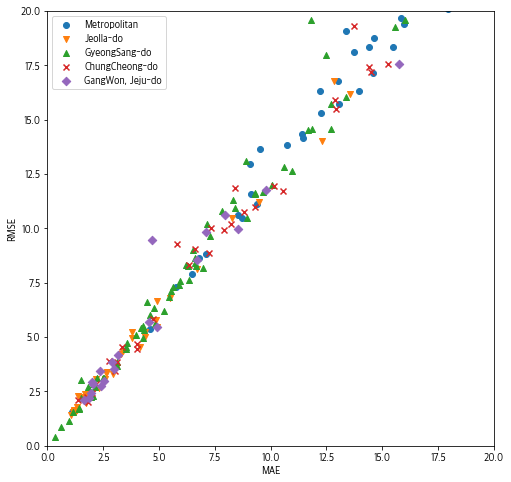

In [191]:
# 지역별로 20일로 해서 metric 다시 계산해야함
plt.figure(figsize=(8,8))
plt.scatter(region_mae[:66], region_rmse[:66], marker='o', label='Metropolitan')
plt.scatter(region_mae[66:107], region_rmse[66:107], marker='v',label='Jeolla-do')
plt.scatter(region_mae[107:177], region_rmse[107:177], marker='^',label='GyeongSang-do')
plt.scatter(region_mae[177:209], region_rmse[177:209], marker='x',label='ChungCheong-do')
plt.scatter(region_mae[209:], region_rmse[209:], marker='D',label='GangWon, Jeju-do')
plt.legend()
plt.xlim([0, 20])
plt.ylim([0, 20])
plt.xlabel('MAE')
plt.ylabel('RMSE')
plt.show()

In [36]:
# 인덱스 통일이 중요함
# 인덱스 통일이 되지 않으면 
df.index = pd.to_datetime(df.index)
zero_df.index = pd.to_datetime(zero_df.index)

df.iloc[:end_idx+20,209:].sum(axis=1).plot()
zero_df[zero_df.index <= '2021-12-19'].iloc[end_idx:end_idx+20,209:].sum(axis=1).plot()

from datetime import datetime
span_start = datetime(2020, 7, 16)
span_end = datetime(2020, 10, 15)
plt.axvspan(span_end, span_start, facecolor='gray')

NameError: name 'zero_df' is not defined

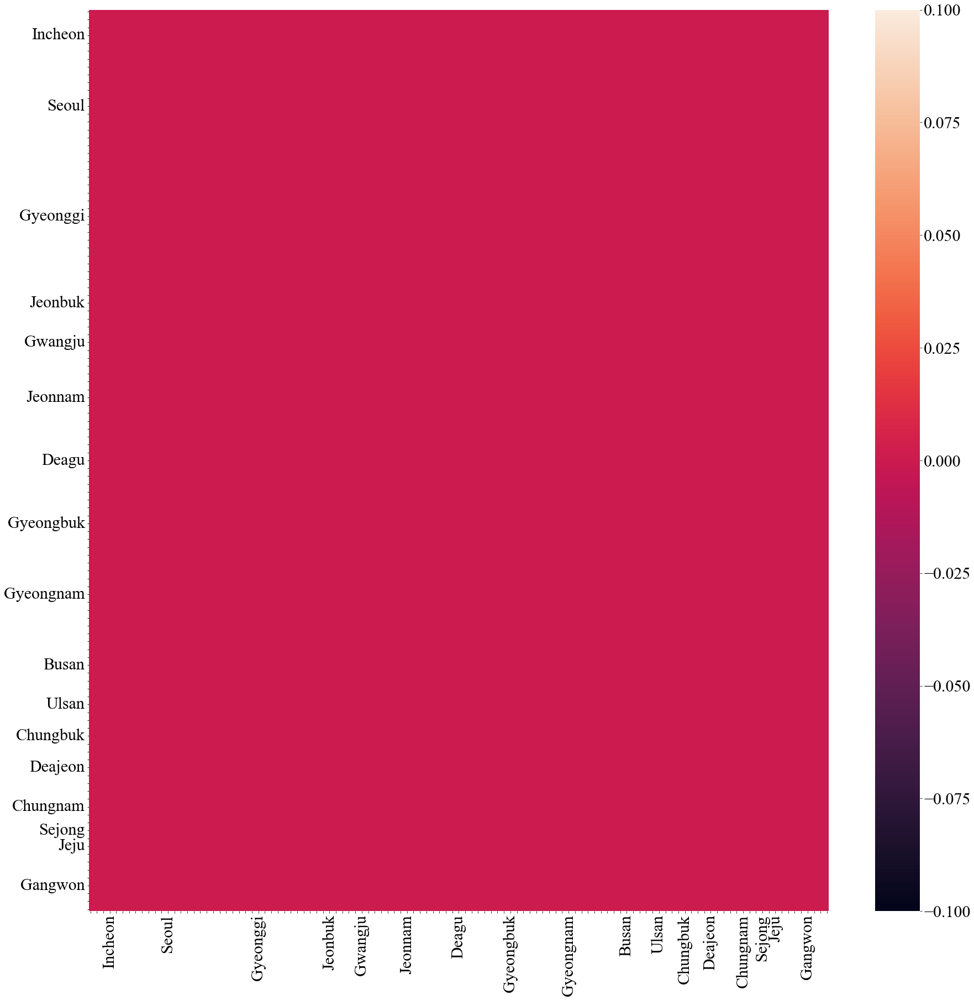

In [35]:
import numpy as np
import seaborn as sns

adj_mx = np.zeros([229, 229])

tmp = pd.DataFrame(adj_mx, columns = df.columns, index=df.columns)
plt.figure(figsize=(30,30))
ax = plt.subplot(1,1,1)
g=sns.heatmap(tmp, ax=ax) #annot=True,

cbar = g.collections[0].colorbar
cbar.ax.tick_params(labelsize=30)

# plt.yticks(fontsize=15, rotation=0)
ticklabel = ['' for _ in range(len(ax.get_yticklabels()))]
ticklabel[3] = 'Incheon'
ticklabel[12] = 'Seoul' #6 ~ 18 Seoul
ticklabel[26] = 'Gyeonggi' #19 ~ 33 Gyeounggi
ticklabel[37] = 'Jeobuk' #34 ~ 40 전북
ticklabel[42] = 'Gwangju' #41 ~ 43 광주
ticklabel[49] = 'Jeonnam' #44 ~ 54 전남
ticklabel[57] = 'Deagu' #55 ~ 58 대구
ticklabel[65] = 'Gyeongbuk' #59 ~ 69 경북
ticklabel[74] = 'Gyeongnam' #70 ~ 78 경남
ticklabel[83] = 'Busan' #79 ~ 86 부산
ticklabel[88] = 'Ulsan' #87 ~ 89 울산
ticklabel[92] = 'Chungbuk' #90 ~ 94 충북
ticklabel[96] = 'Deajeon' #95 ~ 97 대전
ticklabel[101] = 'Chungnam' #98 ~ 104 충남
ticklabel[104] = 'Sejong' #105 ~ 105 세종 (제주랑 글씨가 겹쳐서 104로 지정)
ticklabel[106] = 'Jeju' #106 ~ 106 제주
ticklabel[111] = 'Gangwon' #107 ~ 115 강원  
ax.set_yticklabels(ticklabel, fontsize=30, rotation=0)
ax.set_xticklabels(ticklabel, fontsize=30, rotation=90)
# plt.xticks(ticklabel, fontsize=15, rotation=90)
plt.show()